# Installations

In [2]:
!pip install --upgrade pymupdf


[notice] A new release of pip is available: 24.1.2 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
%pip install nltk
%pip install string

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.1.2 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.


ERROR: Could not find a version that satisfies the requirement string (from versions: none)
ERROR: No matching distribution found for string

[notice] A new release of pip is available: 24.1.2 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [4]:
pip install matplotlib

                                              0.0/8.1 MB ? eta -:--:--
                                              0.0/8.1 MB ? eta -:--:--
                                              0.1/8.1 MB 825.8 kB/s eta 0:00:10
                                              0.1/8.1 MB 1.1 MB/s eta 0:00:08
                                              0.1/8.1 MB 1.1 MB/s eta 0:00:08
     -                                        0.2/8.1 MB 901.1 kB/s eta 0:00:09
     -                                        0.4/8.1 MB 1.1 MB/s eta 0:00:07
     --                                       0.5/8.1 MB 1.3 MB/s eta 0:00:06
     ---                                      0.8/8.1 MB 1.9 MB/s eta 0:00:04
     ----                                     0.9/8.1 MB 2.0 MB/s eta 0:00:04
     -----                                    1.2/8.1 MB 2.4 MB/s eta 0:00:03
     -------                                  1.6/8.1 MB 2.8 MB/s eta 0:00:03
     --------                                 1.7/8.1 MB 3.0 MB/s eta 0:00


[notice] A new release of pip is available: 23.1.2 -> 26.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [4]:
import fitz

if not hasattr(fitz.Page, "find_tables"):
    raise RuntimeError("This PyMuPDF version does not support the table feature")

# Functions

In [5]:
DOC_PATH = r".\documents\curated\American-Red-Cross-First-Aid-CPR-AED-Participants-Manual-CURATED.pdf"

In [5]:
import matplotlib.pyplot as plt
import numpy as np

def show_image(item, title=""):
    """Display a pixmap.

    Just to display Pixmap image of "item" - ignore the man behind the curtain.

    Args:
        item: any PyMuPDF object having a "get_pixmap" method.
        title: a string to be used as image title

    Generates an RGB Pixmap from item using a constant DPI and using matplotlib
    to show it inline of the notebook.
    """
    DPI = 150  # use this resolution

    # %matplotlib inline
    pix = item.get_pixmap(dpi=DPI)
    img = np.ndarray([pix.h, pix.w, 3], dtype=np.uint8, buffer=pix.samples_mv)
    plt.figure(dpi=DPI)  # set the figure's DPI
    plt.title(title)  # set title of image
    _ = plt.imshow(img, extent=(0, pix.w * 72 / DPI, pix.h * 72 / DPI, 0))

In [6]:
def tables_corrdinates(doc_path, page):

    doc = fitz.open(doc_path)
    page = doc.load_page(page)
    tabs = page.find_tables()  # detect the tables
    
    tabs_cord =[]

    for i,tab in enumerate(tabs):  # iterate over all tables
        headers = [h for h in tab.header.cells if h!=None]
        for cell in headers:
            page.draw_rect(cell,color=fitz.pdfcolor["red"],width=0.3)
        print(tab.bbox)
        tabs_cord.append(tab.bbox)
        page.draw_rect(tab.bbox,color=fitz.pdfcolor["green"])
        print(f"Table {i} column names: {tab.header.names}, external: {tab.header.external}")
        # if tabs_cord !=[]:
        #     show_image(page, f"Table & Header BBoxes")
    return tabs_cord

In [9]:
tables_corrdinates(DOC_PATH, 50)

Consider using the pymupdf_layout package for a greatly improved page layout analysis.
(54.15982723236084, 60.282999674479164, 566.9524536132812, 130.0733439127604)
Table 0 column names: ['', 'AED—ADULT OR CHILD\nOLDER THAN 8 YEARS OR WEIGHING MORE THAN 55 POUNDS\nNO BREATHING'], external: False
(54.15982723236084, 221.552001953125, 566.9524536132812, 236.67424774169922)
Table 1 column names: ['', '', 'TURN ON AED'], external: False
(54.15982723236084, 283.38299560546875, 566.9524536132812, 298.625)
Table 2 column names: ['', 'WIPE BARE CHEST DRY'], external: False
(54.15982723236084, 361.0135040283203, 360.6636962890625, 377.2590026855469)
Table 3 column names: ['', 'ATTACH PADS'], external: False


[(54.15982723236084, 60.282999674479164, 566.9524536132812, 130.0733439127604),
 (54.15982723236084, 221.552001953125, 566.9524536132812, 236.67424774169922),
 (54.15982723236084, 283.38299560546875, 566.9524536132812, 298.625),
 (54.15982723236084, 361.0135040283203, 360.6636962890625, 377.2590026855469)]

In [12]:
# lets see the diffent police sizes in the document
def get_font_sizes(doc_path, page):
    doc = fitz.open(doc_path)
    page = doc.load_page(page)
    blocks = page.get_text("dict")["blocks"]
    font_sizes = set()
    for block in blocks:
        if block["type"] == 0:  # text block
            for line in block["lines"]:
                for span in line["spans"]:
                    font_sizes.add(span["size"])
    return sorted(font_sizes)

    

In [13]:
font_sizes = get_font_sizes(DOC_PATH, 0)
print(font_sizes)
#print exepmle of the text with the different font sizes
def get_text_by_font_size(doc_path, page, font_size):
    doc = fitz.open(doc_path)
    page = doc.load_page(page)
    blocks = page.get_text("dict")["blocks"]
    texts = []
    for block in blocks:
        if block["type"] == 0:  # text block
            for line in block["lines"]:
                for span in line["spans"]:
                    if span["size"] == font_size:
                        texts.append(span["text"])
    return texts
for size in font_sizes:
    texts = get_text_by_font_size(DOC_PATH, 0, size)
    print(f"Font size: {size}, Example text: {texts[:3]}")

[6.49656867980957, 8.662057876586914, 10.0, 17.819089889526367, 29.698484420776367, 46.71791458129883, 75.23616790771484]
Font size: 6.49656867980957, Example text: ['CHAPTER']
Font size: 8.662057876586914, Example text: [' ', ' ', ' 1    ']
Font size: 10.0, Example text: ['edical emergencies can happen every day, in any setting. People are injured in situations like falls or ', 'motor-vehicle accidents, or they develop sudden illnesses, such as heart attack or stroke.', 'The statistics are sobering. For example, about 900,000 people in the United States die each year from some ']
Font size: 17.819089889526367, Example text: ['CHAPTER     ']
Font size: 29.698484420776367, Example text: ['Before Giving Care and Checking ', 'an Injured or Ill Person']
Font size: 46.71791458129883, Example text: ['M']
Font size: 75.23616790771484, Example text: ['1']


In [2]:
CHAPTER_FONT_SIZE = 29

In [ ]:
# ...existing code...
# Noz for the custo; chunkingm ze sport every CHAPTER_FONT_SIZE as a new chapter QND SQVE QLL THE PQRQGRQPH QFTER IT ? IN ORDER TO GROUP QLL BQSED ON CHapters
import os

def get_chapters(doc_source, chapter_font_size):
    """
    Extracts chapters from a document source (file or directory).
    Returns a list of dictionaries with keys: 'doc_name', 'title', 'text', 'pages'.
    """
    # Determine if source is a directory or file
    files_to_process = []
    if os.path.isdir(doc_source):
        files_to_process = [os.path.join(doc_source, f) for f in os.listdir(doc_source) if f.lower().endswith('.pdf')]
    elif os.path.isfile(doc_source):
        files_to_process = [doc_source]
    else:
        print(f"Invalid source: {doc_source}")
        return []

    all_chapters = []

    for doc_path in files_to_process:
        try:
            doc = fitz.open(doc_path)
            doc_name = os.path.basename(doc_path)
            current_chapter = None
            
            # Iterate through ALL pages
            for page_num, page in enumerate(doc):
                blocks = page.get_text("dict")["blocks"]
                for block in blocks:
                    if block["type"] == 0:  # text block
                        for line in block["lines"]:
                            for span in line["spans"]:
                                # Check for Chapter Title
                                if int(span["size"]) == chapter_font_size:

                                    if current_chapter is not None:
                                        # Save previous chapter before starting new one
                                        text = "\n".join(current_chapter["content"]).strip()
                                        if text == "":
                                        # let's check if the new chapter is a title extension of the previous one by checking if its previous text content is '' or not, if it is we will merge it with the previous chapter instead of creating a new one
                                            current_chapter["title"] += " " + span["text"].strip()
                                        else:
                                            current_chapter["text"] = text
                                            del current_chapter["content"] # Remove temp list
                                            all_chapters.append(current_chapter)
                                    
                                            # Start new chapter
                                            current_chapter = {
                                                "doc_name": doc_name,
                                                "title": span["text"].strip(),
                                                "content": [],
                                                "pages": {page_num + 1} # Use set to track unique pages
                                            }
                                    else:
                                        # Start first chapter
                                        current_chapter = {
                                            "doc_name": doc_name,
                                            "title": span["text"].strip(),
                                            "content": [],
                                            "pages": {page_num + 1}
                                        }
                                elif current_chapter is not None:
                                    # Append content to current chapter
                                    current_chapter["content"].append(span["text"])
                                    current_chapter["pages"].add(page_num + 1)
            
            # Append the last chapter of the document
            if current_chapter is not None:
                current_chapter["text"] = "\n".join(current_chapter["content"]).strip()
                del current_chapter["content"]
                all_chapters.append(current_chapter)
                
            doc.close()
            
        except Exception as e:
            print(f"Error processing {doc_path}: {e}")

    # Convert sets to sorted lists for final JSON structure
    for chapter in all_chapters:
        chapter["pages"] = sorted(list(chapter["pages"]))

    return all_chapters

chapters = get_chapters(DOC_PATH, CHAPTER_FONT_SIZE)
for chapter in chapters:
    print(chapter)
    
# ...existing code...

Extracted 15 chapters.

Chapter 1: Before Giving Care and Checking

Chapter 2: an Injured or Ill Person CHAPTER
  Page 1: 1 M edical emergencies can happen every day, in any setting. People are injured in situations like f...
  Page 2: 2 First Aid/CPR/AED | Participant’s Manual YOUR ROLE IN THE EMS SYSTEM You play a major role in maki...
  Page 3: CHAPTER 1 | Before Giving Care and Checking an Injured or Ill Person 3 Clutching the chest or throat...
  Page 4: 4 First Aid/CPR/AED | Participant’s Manual Fear of Being Sued Sometimes people worry that they might...
  Page 5: CHAPTER 1 | Before Giving Care and Checking an Injured or Ill Person 5 Getting Permission to Give Ca...
  Page 6: 6 First Aid/CPR/AED | Participant’s Manual FOCUS ON PREPAREDNESS Important Information Keep medical ...
  Page 7: CHAPTER 1 | Before Giving Care and Checking an Injured or Ill Person 7 Avoid handling any of your pe...
  Page 8: 8 First Aid/CPR/AED | Participant’s Manual to 1 gallon of fresh water (1 part bl

In [4]:
from termcolor import colored

def printt(strr, color='red',  attrs=['bold']):
    print(colored(strr, color, attrs=attrs))
printt('hello')

hello


# Tables Preview

In [10]:
import fitz  # PyMuPDF
import copy

def process_page_excluding_rectangles(doc_path, page_num, exclude_rects):
    """
    Processes all sections of a page excluding specified rectangular areas.
    
    Parameters:
    - doc: The opened PDF document.
    - page_num: The page number to process (0-based index).
    - exclude_rects: A list of fitz.Rect objects representing areas to exclude.
    
    Returns:
    - A dictionary containing text and images from the remaining parts of the page.
    """
    doc = fitz.open(doc_path)
    page = doc.load_page(page_num)
    page_rect = page.rect
    if exclude_rects==[]:
        return [page_rect]
    
    # Initialize a list to store the remaining areas after exclusion
    remaining_rects = page_rect

    # Adjust remaining_rects by subtracting the areas defined in exclude_rects
    rect = remaining_rects
    new_remaining_rects = []
    for exclude_rect in exclude_rects:
        e = fitz.Rect(exclude_rect)
        
        
        # Top section above the exclude_rect
        # print('rect.y0 , exclude_rect.y0', rect.y0 , e.y0)
        if rect.y0 <= e.y0:
            r = copy.deepcopy(rect)
            new_remaining_rects.append(fitz.Rect(r.x0, r.y0, r.x1, e.y0))
            rect = fitz.Rect(rect.x0, e.y1, rect.x1, rect.y1)
            print('Text Section', (r.x0, r.y0, r.x1, e.y0))
            # print('Remaining Page', (r.x0, e.y1, r.x1, r.y1))
            # print('remaining_rects', new_remaining_rects)
        if exclude_rect==exclude_rects[-1]:
            # Bottom section below the exclude_rect
            if rect.y1 >= e.y1:
                r = copy.deepcopy(rect)
                new_remaining_rects.append(fitz.Rect(r.x0, e.y1, r.x1, r.y1))
                rect = fitz.Rect(rect.x0, e.y1, rect.x1, rect.y1)
                # print('remaining_rects', new_remaining_rects)
    # Process and combine results from the remaining areas
    combined_text = ""
    images = []

    # print('remaining_rects', new_remaining_rects)
    if new_remaining_rects!=[]:
        print(50*'-', new_remaining_rects)
        for i,tab in enumerate(new_remaining_rects):  # iterate over all tables
            page.draw_rect(tab,color=fitz.pdfcolor["blue"],width=5)
        
        show_image(page, f"Table & Header BBoxes")
    return new_remaining_rects

    for rect in new_remaining_rects:
        if rect.is_empty:
            continue
        text = page.get_text("text", clip=rect)
        combined_text += text
        pix = page.get_pixmap(clip=rect)
        images.append(pix)
    
    return {
        "text": combined_text,
        "images": images
    }

Text Section (0.0, 0.0, 595.3200073242188, 693.2799886067709)
-------------------------------------------------- [Rect(0.0, 0.0, 595.3200073242188, 693.2799886067709), Rect(0.0, 753.0899696350098, 595.3200073242188, 841.9199829101562)]


[Rect(0.0, 0.0, 595.3200073242188, 693.2799886067709),
 Rect(0.0, 753.0899696350098, 595.3200073242188, 841.9199829101562)]

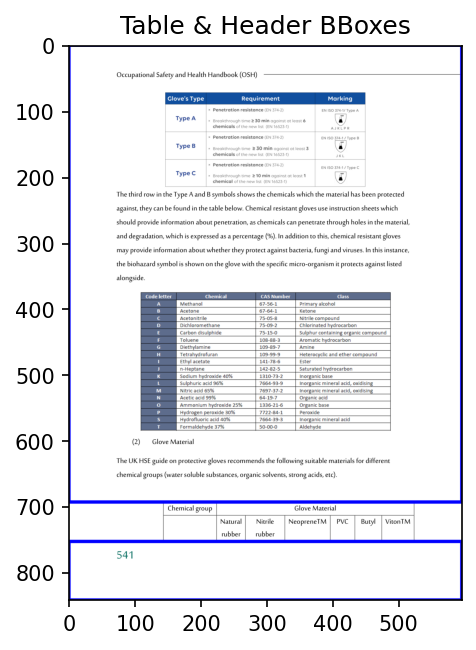

In [11]:
process_page_excluding_rectangles(DOC_PATH, 50,[(142.96000162760416, 693.2799886067709, 523.1607055664062, 753.0899696350098)])

# Images preview from extraction

In [12]:
from PIL import Image
import io
import fitz

doc = fitz.open(DOC_PATH)
# for page_num in range(doc.page_count):
page = doc.load_page(50)
block_ = page.get_text("dict")["blocks"]

for block in block_:
    if 'image' in block:
        # Convert the byte sequence to a BytesIO object
        image_bytes = block['image']
        image_stream = io.BytesIO(image_bytes)

        # Open the image using PIL
        image = Image.open(image_stream)

        # Display the image
        image.show()

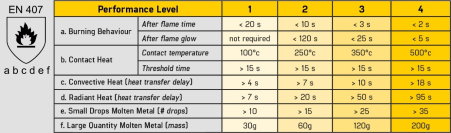

In [13]:
import fitz  # PyMuPDF
import io
from IPython.display import SVG, display

# Load a specific page, for example, page 50 (index 49)
doc = fitz.open(r"C:\Users\YoussefGHAOUI\Documents\tmp\data\PPE_Handbook.pdf")
page = doc.load_page(51)

# Get the text blocks from the page
block_ = page.get_text("dict")["blocks"]

# Iterate over blocks to find and process images
for i, block in enumerate(block_):
    if 'image' in block:
        # Get the bounding box of the image
        bbox = fitz.Rect(block['bbox'])

        # Clip the page to the bounding box of the image
        page.set_cropbox(bbox)

        # Extract the clipped area as an SVG image
        svg_image = page.get_svg_image(matrix=fitz.Identity, text_as_path=True)

        # Display the SVG image
        svg_io = io.StringIO(svg_image)
        display(SVG(svg_io.getvalue()))

        # # Optionally save the SVG image to a file
        # with open(f"clipped_image_{i}.svg", "w", encoding="utf-8") as f:
        #     f.write(svg_image)


In [15]:
def images_corrdinates(doc_path, page):

    doc = fitz.open(doc_path)
    page = doc.load_page(page)
    # Get the text blocks from the page
    block_ = page.get_text("dict")["blocks"]
    
    images_cord =[]

    for i, block in enumerate(block_):
        if 'image' in block:
            # Get the bounding box of the image
            bbox = fitz.Rect(block['bbox'])
            images_cord.append(bbox)
            page.draw_rect(bbox,color=fitz.pdfcolor["yellow"])
            # print(f"Image {i}")
    if images_cord !=[]:
        show_image(page, f"Table & Header BBoxes")
    return images_cord

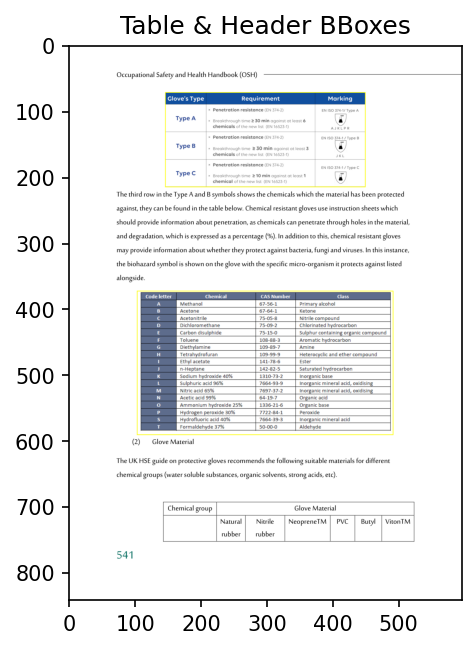

In [16]:
images_cords = images_corrdinates(DOC_PATH, 50)

In [21]:
images_cords

[Rect(146.12503051757812, 72.00001525878906, 449.1421813964844, 215.25),
 Rect(103.39991760253906, 373.2382507324219, 491.2498779296875, 591.1836547851562)]

In [25]:
page.rect.x1

595.3200073242188

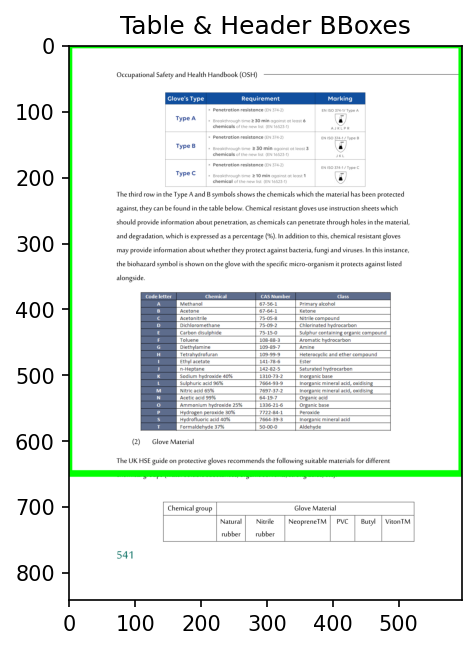

In [17]:
doc = fitz.open(r"C:\Users\YoussefGHAOUI\Documents\tmp\data\PPE_Handbook.pdf")

page = doc.load_page(50)
page.draw_rect(fitz.Rect(0, 0, page.rect.x1, 650),color=fitz.pdfcolor["green"],width=10)
show_image(page, f"Table & Header BBoxes")

In [18]:
import fitz  # PyMuPDF
import copy
import pymupdf
def process_textbox_excluding_images_rectangles(doc_path, page_num,remaining_sections=None, images_exclude_rects=[]):
    """
    Processes all sections of a page excluding specified rectangular areas.
    
    Parameters:
    - doc: The opened PDF document.
    - page_num: The page number to process (0-based index).
    - images_exclude_rects: A list of fitz.Rect objects representing areas to exclude.
    
    Returns:
    - A dictionary containing text and images from the remaining parts of the page.
    """


    doc = fitz.open(doc_path)
    page = doc.load_page(page_num)
    if remaining_sections==None:
        remaining_sections = [page.rect]

    if images_exclude_rects==[]:
        return remaining_sections
    
    new_remaining_rects = []

    
    for ii, section in enumerate(remaining_sections):
        printt(f'Boxe{ii}:\n')
        if type(section)==pymupdf.Rect:
            page_rect = section
        else:
            page_rect = fitz.Rect(section)


        # Initialize a list to store the remaining areas after exclusion
        rect = page_rect

        
        for exclude_rect in images_exclude_rects:
            e = fitz.Rect(exclude_rect)
            print(e)
            
            # Top section above the exclude_rect
            # print('rect.y0 , exclude_rect.y0', rect.y0 , e.y0)
            IMAGE_IN_SECTION = (rect.y1 > e.y1) and (rect.y0< e.y0)

            if IMAGE_IN_SECTION: # Text lezem youfa kbal manousel lel imagePS: Image are either inside the secton or outside
                r = copy.deepcopy(rect)
                new_remaining_rects.append(fitz.Rect(r.x0, r.y0, r.x1, e.y0))
                rect = fitz.Rect(r.x0, e.y1, r.x1, r.y1)
                print('Text Section', (r.x0, r.y0, r.x1, e.y0))
                # print('Remaining Page', (r.x0, e.y1, r.x1, r.y1))
                # print('remaining_rects', new_remaining_rects)
            if exclude_rect==images_exclude_rects[-1]:
                print('Bottom check')
                # Bottom section below the exclude_rect
                r = copy.deepcopy(rect)
                new_remaining_rects.append(r)

                    # print('remaining_rects', new_remaining_rects)
        # Process and combine results from the remaining areas
        combined_text = ""
        images = []

    # print('remaining_rects', new_remaining_rects)
    if new_remaining_rects!=[]:
        print(50*'-', new_remaining_rects)
        for i,tab in enumerate(new_remaining_rects):  # iterate over all tables
            page.draw_rect(tab,color=fitz.pdfcolor["blue"],width=7)
        
        show_image(page, f"Text Sections excluding Tables&Images")
    return new_remaining_rects

(142.96000162760416, 693.2799886067709, 523.1607055664062, 753.0899696350098)
Table 0 column names: ['Chemical group', 'Glove Material', None, None, None, None, None], external: False
Text Section (0.0, 0.0, 595.3200073242188, 693.2799886067709)
-------------------------------------------------- [Rect(0.0, 0.0, 595.3200073242188, 693.2799886067709), Rect(0.0, 753.0899696350098, 595.3200073242188, 841.9199829101562)]
Boxe0:

Rect(146.12503051757812, 72.00001525878906, 449.1421813964844, 215.25)
Text Section (0.0, 0.0, 595.3200073242188, 72.00001525878906)
Rect(103.39991760253906, 373.2382507324219, 491.2498779296875, 591.1836547851562)
Text Section (0.0, 215.25, 595.3200073242188, 373.2382507324219)
Bottom check
Boxe1:

Rect(146.12503051757812, 72.00001525878906, 449.1421813964844, 215.25)
Rect(103.39991760253906, 373.2382507324219, 491.2498779296875, 591.1836547851562)
Bottom check
-------------------------------------------------- [Rect(0.0, 0.0, 595.3200073242188, 72.00001525878906),

[Rect(0.0, 0.0, 595.3200073242188, 72.00001525878906),
 Rect(0.0, 215.25, 595.3200073242188, 373.2382507324219),
 Rect(0.0, 591.1836547851562, 595.3200073242188, 693.2799886067709),
 Rect(0.0, 753.0899696350098, 595.3200073242188, 841.9199829101562)]

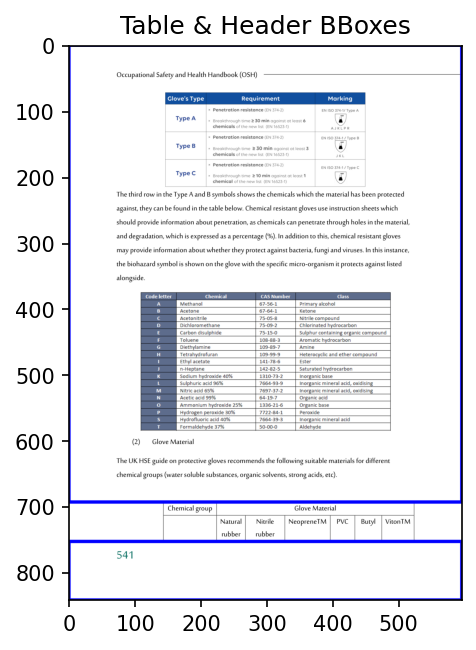

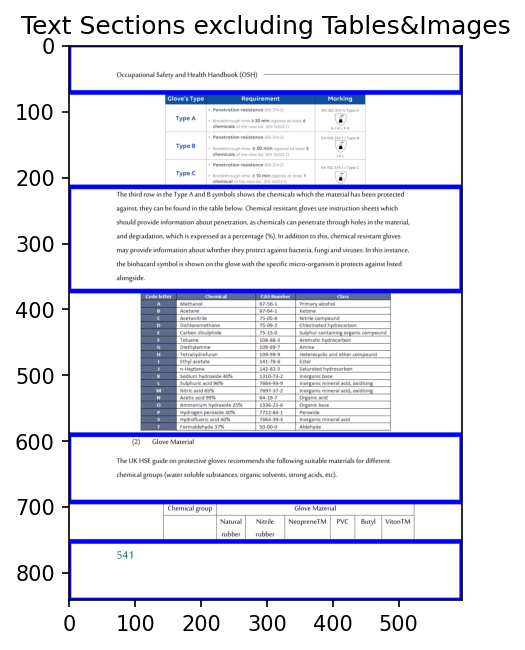

In [21]:
c = tables_corrdinates(DOC_PATH, 50)
cc =  process_page_excluding_rectangles(DOC_PATH, 50,c)
process_textbox_excluding_images_rectangles(DOC_PATH, 50,cc, images_cords)

In [22]:
process_textbox_excluding_images_rectangles(DOC_PATH, 50,cc)

[Rect(0.0, 0.0, 595.3200073242188, 693.2799886067709),
 Rect(0.0, 753.0899696350098, 595.3200073242188, 841.9199829101562)]

# Without metadata

* Text Data exculuding tables execution

Occupational Safety and Health Handbook (OSH) 
491 
 
Chapter 7—Personal Protective Equipment 
10.47 Compliance with Regulations and Standards. 
10.48 General requirements. 
10.49 Eye and face protection. 
10.50 Respiratory protection. 
10.51 Head protection. 
10.52 Foot protection. 
10.53 Electrical protective equipment. 
10.54 Hand protection. 
10.55 Personal fall protection systems. 
10.47
Started : 10.47
 
Started :  
Compliance with regulations and standards 
Started : Compliance with regulations and standards 
Employers and employees shall adhere to the Saudi Labor Law, Modon: Safety and occupational health 
We are going to fill the subchapter 10.47 Compliance with regulations and standards 
+Content for 10.47 Compliance with regulations and standards 
guidelines, SASO-3001 Occupational safety and health procedures in the work environment - safety 
+Content for 10.47 Compliance with regulations and standards 
helmet, SASO Guide on occupational safety and health – Safety Shoes, an

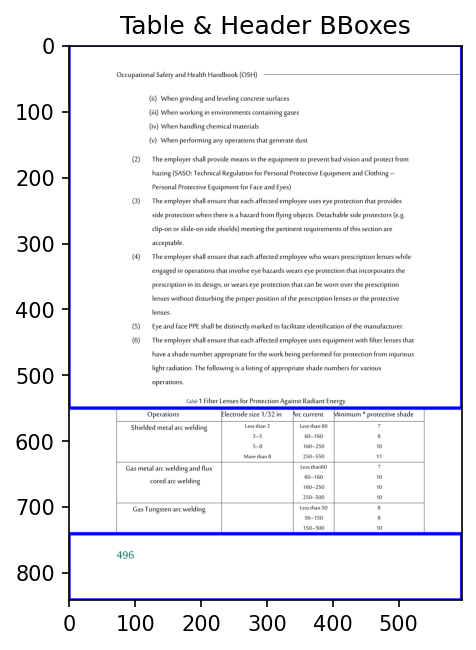

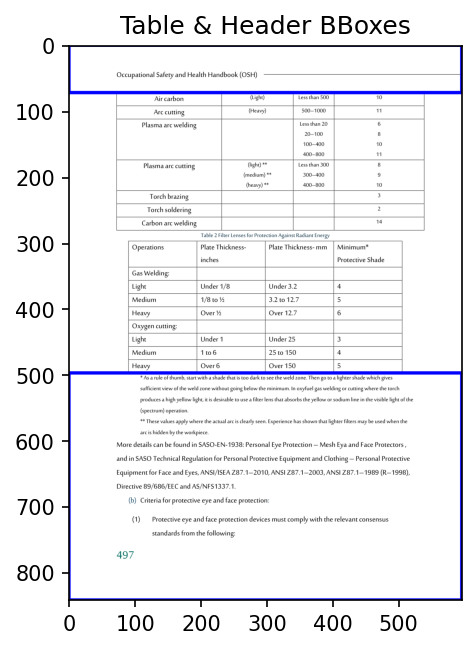

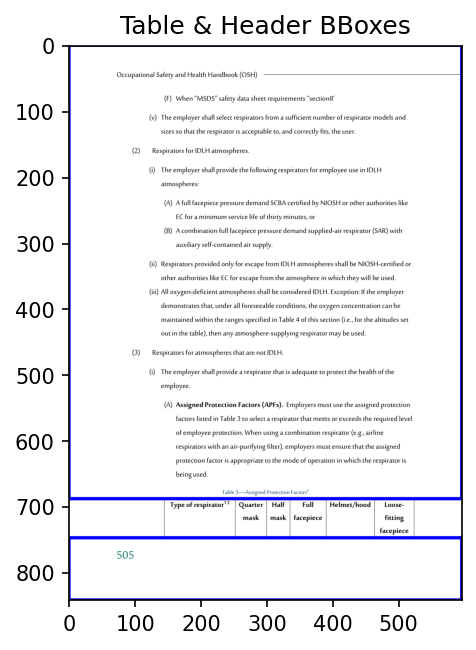

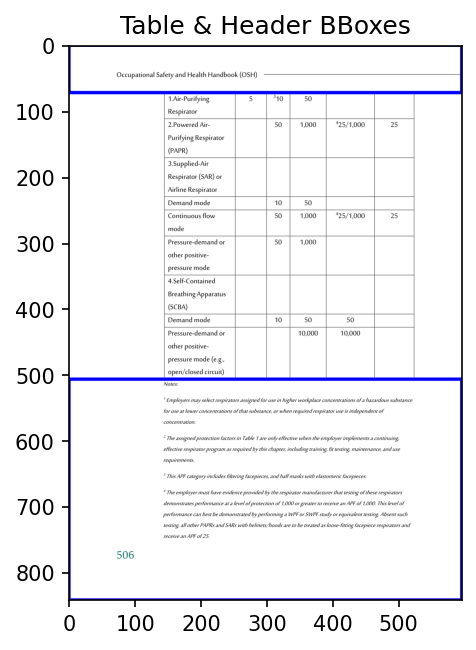

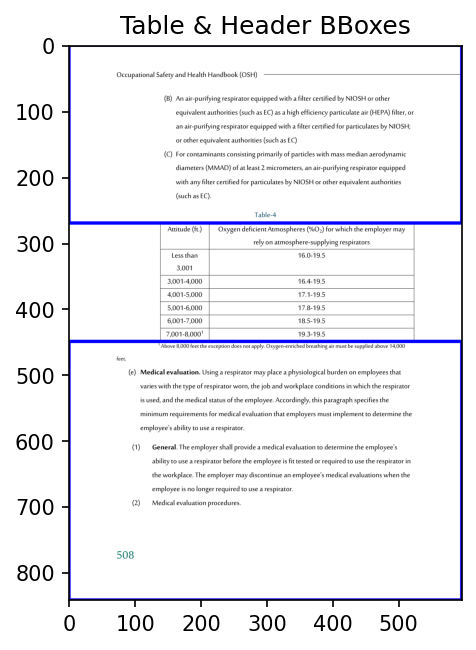

...

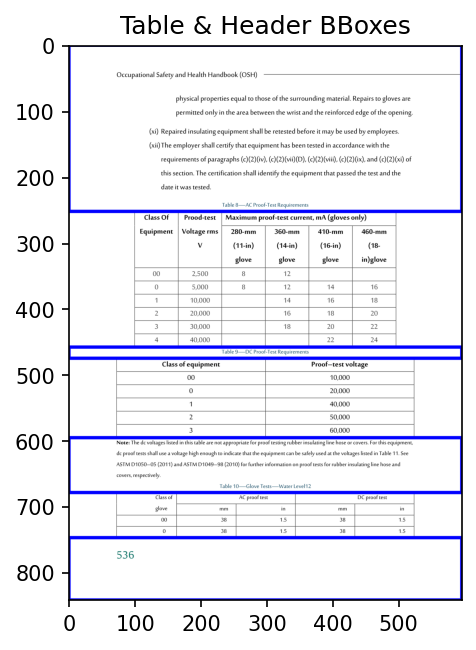

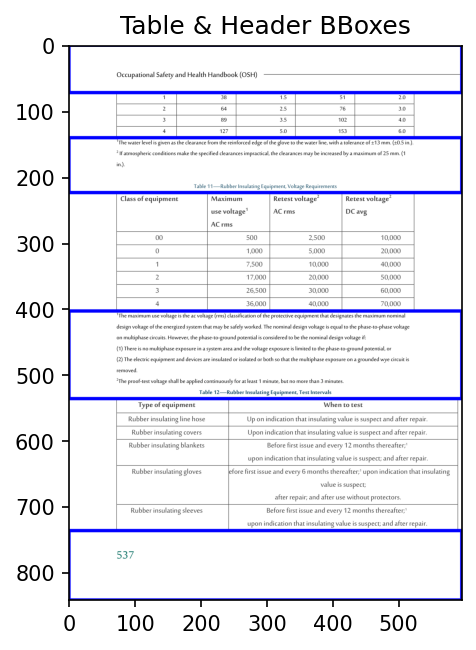

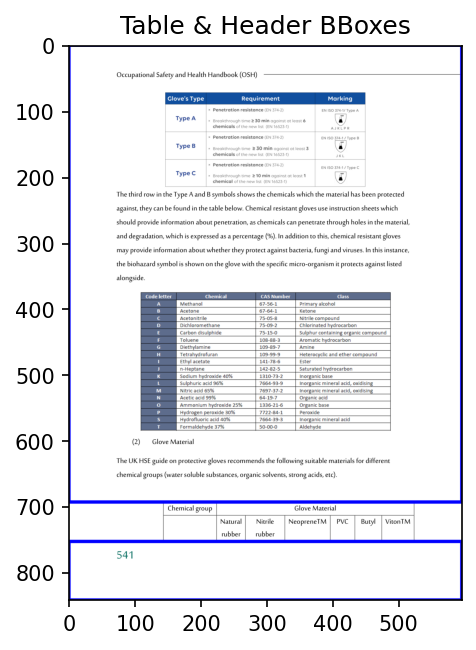

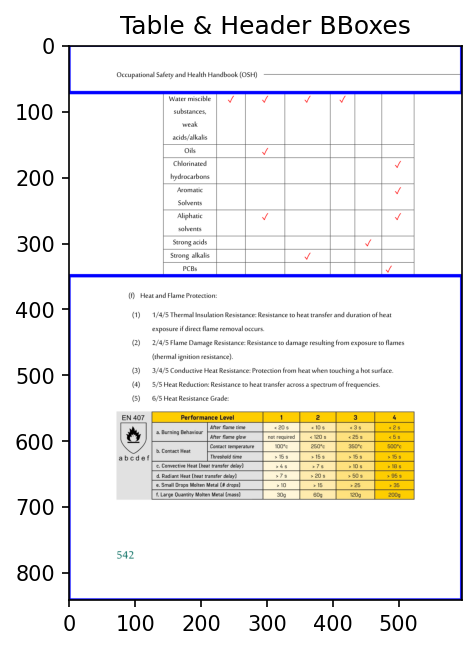

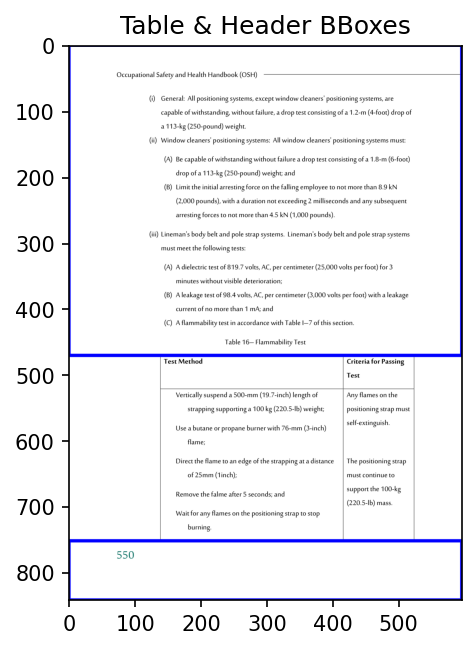

In [24]:
SUBCHAPTER_SIZE = 19 
LEGENDS_SIZE = 10
PAGENB_SIZE = 22
CONTENT_SIZE = 13
STARTER_PAGE = 491
MAIN_CHAPTER = 'Chapter 7—Personal Protective Equipment'

ppe_data=[]

# Function to extract text and group by font size
def extract_text_grouped_by_font_size(doc_path):
    chapter_data = {}
    contents = []
    legends =[]
    Started =False
    TABLE_OF_CONTENT_CHECK = False
    doc = fitz.open(doc_path)
    for page_num in range(doc.page_count):
        page = doc.load_page(page_num)
        TAB_EXIST =False
        exclude_rects = tables_corrdinates(doc_path, page_num)
        if exclude_rects!=[]:
            new_remaining_rects = process_page_excluding_rectangles(doc_path, page_num, exclude_rects)
        
            blocks=[]
            printt('new_remaining_rects')
            print( new_remaining_rects)
            for rect in new_remaining_rects:
                if rect.is_empty:
                    continue
                TAB_EXIST =True
                block_ = page.get_text("dict",clip=rect)["blocks"]
                if block_:
                    # for block in block_:
                    blocks.append(block_)
            # printt('blocks')
            # for block in blocks:
            #     printt(block)

        else :
            blocks = [page.get_text("dict")["blocks"]]  

        page_contents =[]
        temp_data = {
            'page' : STARTER_PAGE + page_num,
            'page_contents' : page_contents
        }
        # print(f'AT THE START temp_data', temp_data)
        
        for block_list in blocks:
            for block in block_list:
                if "lines" in block:
                    for line in block["lines"]:
                        for i, span in enumerate(line["spans"]):
                            text = span["text"]
                            font_size = int(span["size"])
                            print(text)

                            # Filling our data 
                            # if TABLE_OF_CONTENT_CHECK == True:
                                

                            if font_size == SUBCHAPTER_SIZE :

                                Started =True
                                printt(f'Started : {text}','blue')
                                # temp_data = {
                                #     'page' : STARTER_PAGE + page_num,
                                #     'page_contents' : []
                                # }
                                if TABLE_OF_CONTENT_CHECK == False:
                                    chapter=''
                                chapter+= text
                                TABLE_OF_CONTENT_CHECK = True
                                continue         
                            else:
                                if TABLE_OF_CONTENT_CHECK == True and Started : # If we moved to the next chapter : text is a content
                                    printt('We are going to fill the subchapter '+chapter, 'green')
                                    if chapter_data != {}:
                                        chapter_data.update({'contents' : contents,
                                                                'legends' : legends})
                                        # temp_data['page_contents'].append(chapter_data)
                                        printt(chapter_data, 'blue')
                                    
                                    # Adapting to the new subchapter
                                    chapter_data = {'chapter': chapter}
                                    contents = []
                                    legends =[]
                                    TABLE_OF_CONTENT_CHECK = False
                                    

                            if Started:
                                if font_size == CONTENT_SIZE:
                                    contents.append(text)
                                    printt('+Content for '+chapter)
                                elif font_size == LEGENDS_SIZE:
                                    # legends.append(text)
                                    contents.append(text)
                                    printt('+legend for '+chapter)
                                else:
                                    print('Unmatchable Font Size', font_size)
                                # else:
                                #     printt('Possible Table of Content ! \n')
            printt('(TAB_EXIST) and (block_list!=blocks[-1])')
            print(TAB_EXIST, block_list!=blocks[-1], contents[-1]!= 'Occupational Safety and Health Handbook (OSH) ')
            if (TAB_EXIST) and (block_list!=blocks[-1]) and (contents[-1]!= 'Occupational Safety and Health Handbook (OSH) '):
                contents.append('((TABLE))')

        print(f'Page{page_num} finished')
        # print({'contents' , '-'.join(contents),
        #                             'legends' , '-'.join(legends)})
        # In case we finished the page, and didnt fill the temp data with updated contents and legends
        if contents !=[] or legends!=[]:
            chapter_data.update({'contents' : contents,
                                    'legends' : legends})
            page_contents.append(chapter_data)

            temp_data = {
                'page' : STARTER_PAGE + page_num,
                'page_contents' : page_contents
            }
            EL = copy.deepcopy(temp_data)
            # for e in ppe_data:
            #         print(f'ppe_data BEFORE TMP ', e)
            ppe_data.append(EL)
            # for e in ppe_data:
            #     print(f'ppe_data AFTRER TMP', e)
            # Reset
            contents, legends = [], []
            


extract_text_grouped_by_font_size(r"C:\Users\YoussefGHAOUI\Documents\tmp\data\PPE_Handbook.pdf")

In [25]:
ppe_data

[{'page': 491,
  'page_contents': [{'chapter': '10.47 Compliance with regulations and standards ',
    'contents': ['Employers and employees shall adhere to the Saudi Labor Law, Modon: Safety and occupational health ',
     'guidelines, SASO-3001 Occupational safety and health procedures in the work environment - safety ',
     'helmet, SASO Guide on occupational safety and health – Safety Shoes, and in SASO-2992 Occupational ',
     'safety and health procedures in the work environment - safety shoes, SASO Technical Regulation for ',
     'Personal Protective Equipment and Clothing , SASO 1938 : Personal Eye Protection – Mesh Eya and Face ',
     'Protectors, SASO 174, SASO 207, SASO 208, SASO 379, SASO 1731, SASO Guide on occupational safety ',
     'and health – Hand Protection , SASO-3000 Occupational safety and health procedures in the work ',
     'environment - protect hands, NIOSH, ISO 4850, ANSI/ISEA Z87.1–2010, ANSI Z87.1–2003, ANSI ',
     'Z87.1–1989 (R–1998), ANSI/Compress

# With metadata

* Along with taxt, we include as metadata:
    - image_path
    - table_content

In [26]:
import os
from collections import Counter
tables_counts_per_numpages = Counter([int(x.replace('.txt','').replace('table','').split('_')[0]) for x in os.listdir(r'C:\Users\YoussefGHAOUI\Documents\tmp\tablesGPTformat')])
tables_counts_per_numpages

Counter({46: 3,
         32: 2,
         47: 2,
         15: 1,
         18: 1,
         35: 1,
         40: 1,
         51: 1,
         6: 1,
         60: 1,
         7: 1})

In [27]:
tables_counts_per_numpages[46]

3

In [28]:
ill_list = os.listdir(r'C:\Users\YoussefGHAOUI\Downloads\PPE_Images\illustrations')+os.listdir(r'C:\Users\YoussefGHAOUI\Downloads\PPE_Images\tables')
ill_list

['image_498_1.jpg',
 'image_498_3.jpg',
 'image_498_4.jpg',
 'image_499_1.jpg',
 'image_499_2.jpg',
 'image_521_1.jpg',
 'image_523_1.jpg',
 'image_523_2.jpg',
 'image_527_1.jpg',
 'image_530_1.jpg',
 'image_530_2.jpg',
 'image_539_2.jpg',
 'image_540_1.jpg',
 'image_541_2.jpg',
 'image_542_1.jpg',
 'image_498_2.jpg',
 'image_525_1.jpg',
 'image_529_1.jpg',
 'image_529_2.jpg',
 'image_539_1.jpg',
 'image_539_3.jpg',
 'image_541_1.jpg']

In [29]:
images_counts_per_numpages = Counter([int(x.replace('.jpg','').replace('image_','').split('_')[0]) for x in ill_list])
images_counts_per_numpages

Counter({498: 4,
         539: 3,
         499: 2,
         523: 2,
         530: 2,
         541: 2,
         529: 2,
         521: 1,
         527: 1,
         540: 1,
         542: 1,
         525: 1})

In [69]:
SUBCHAPTER_SIZE = 19 
LEGENDS_SIZE = 10
PAGENB_SIZE = 22
CONTENT_SIZE = 13
STARTER_PAGE = 491
MAIN_CHAPTER = 'Chapter 7—Personal Protective Equipment'
from  copy import deepcopy as dc


ppe_data_metadated=[]

# Function to extract text and group by font size
def extract_text_grouped_by_font_size(doc_path):
    chapter_data = {}
    contents = []
    legends =[]
    Started =False
    TABLE_OF_CONTENT_CHECK = False
    
    doc = fitz.open(doc_path)
    for page_num in range(doc.page_count):
        doc = fitz.open(doc_path)
        page = doc.load_page(page_num)
        TAB_EXIST =False
        LAST_SECTION_NEEDED = False
        IMAGE_EXIST =False 
        CONTENTS_ORDER =[]
        ANOMALY_INDEX = False

        exclude_rects = tables_corrdinates(doc_path, page_num)
        sections =  process_page_excluding_rectangles(doc_path, page_num,exclude_rects)
        if sections == [page.rect]:
            printt('No Tables!','yellow')
        else:
            TAB_EXIST =True
            printt('Tables Exist!','green')
            print(sections)


            
        images_cords = images_corrdinates(doc_path, page_num)
        new_remaining_rects = process_textbox_excluding_images_rectangles(doc_path, page_num, sections, images_exclude_rects=images_cords)
        if new_remaining_rects in [[page.rect], sections]:
            printt('No Images!','yellow')     
        else:
            IMAGE_EXIST =True  
            printt('Images Exist!','green') 
            print(new_remaining_rects)    
        blocks=[]
        printt('new_remaining_rects')
        print( new_remaining_rects)
        if len(new_remaining_rects) > 1:
            LAST_SECTION_NEEDED = True
            for rect in new_remaining_rects[:-1]:
                if rect.is_empty:
                    continue
                
                if IMAGE_EXIST and TAB_EXIST:
                    # NOW WE CHECK EITHER THE CONTENT POST THE TEXT IS IMAGE OR TABLE
                    if any([rect.y1 ==s.y1 for s in sections]) :
                        CONTENTS_ORDER.append('TABLE')
                    else:
                            CONTENTS_ORDER.append('IMAGE')
                elif IMAGE_EXIST:
                    CONTENTS_ORDER.append('IMAGE')
                elif TAB_EXIST:
                    CONTENTS_ORDER.append('TABLE')

        

                block_ = page.get_text("dict",clip=rect)["blocks"]
                if block_:
                    # for block in block_:
                    blocks.append(block_)
        else:
            block_ = page.get_text("dict")["blocks"]
            if block_:
                # for block in block_:
                blocks.append(block_)

        if LAST_SECTION_NEEDED:
            block_ = page.get_text("dict",clip=new_remaining_rects[-1])["blocks"]
            if block_:
                # for block in block_:
                blocks.append(block_)


        page_contents =[]
        temp_data = {
            'page' : STARTER_PAGE + page_num,
            'page_contents' : page_contents
        }
        # print(f'AT THE START temp_data', temp_data)
        print(50*'--',CONTENTS_ORDER, 50*'--')
        printt(f'page{STARTER_PAGE + page_num}'+'number of blocks'+f'{len(blocks)}','light_cyan',attrs=['underline'])
        for block_list in blocks:
            printt(f'page{STARTER_PAGE + page_num}','light_cyan',attrs=['underline'])
            for block in block_list:
                if "lines" in block:
                    for line in block["lines"]:
                        for i, span in enumerate(line["spans"]):
                            text = span["text"]
                            font_size = int(span["size"])
                            print(text)

                            # Filling our data 
                            # if TABLE_OF_CONTENT_CHECK == True:
                                

                            if font_size == SUBCHAPTER_SIZE :

                                Started =True
                                printt(f'Started : {text}','blue')


                                if TABLE_OF_CONTENT_CHECK == False:
                                    chapter=''
                                chapter+= text
                                TABLE_OF_CONTENT_CHECK = True
                                continue         
                            else:
                                if TABLE_OF_CONTENT_CHECK == True and Started : # If we moved to the next chapter : text is a content
                                    if chapter_data != {}:
                                        printt('Finishing up the conetent from the last chapter')
                                        chapter_data.update({'contents' : contents,
                                                                'legends' : legends})
                                        temp_data = dc(chapter_data)
                                        page_contents.append(temp_data)                                        
                                        printt(temp_data, 'blue')
                                    # else:
                                    printt('We are going to fill the subchapter '+chapter, 'green')
                                    # Adapting to the new subchapter
                                    chapter_data = {'chapter': chapter}
                                    contents = []
                                    legends =[]

                                    TABLE_OF_CONTENT_CHECK = False
                                    

                            if Started:
                                if font_size == CONTENT_SIZE:
                                    contents.append(text)
                                    printt('+Content for '+chapter)
                                elif font_size == LEGENDS_SIZE:
                                    # legends.append(text)
                                    contents.append(text)
                                    printt('+legend for '+chapter)
                                else:
                                    print('Unmatchable Font Size', font_size)
                                # else:
                                #     printt('Possible Table of Content ! \n')



            printt('(TAB_EXIST) and (block_list!=blocks[-1])')
            # print(TAB_EXIST, block_list!=blocks[-1], contents[-1]!= 'Occupational Safety and Health Handbook (OSH) ')
            if (TAB_EXIST or IMAGE_EXIST) and (block_list!=blocks[-1]) and CONTENTS_ORDER!=[]:# and (contents[-1]!= 'Occupational Safety and Health Handbook (OSH) '):

                string = dc(CONTENTS_ORDER[0])
                print(string)
                
                print(500*'-')
                

                if string =='TABLE':
                    # We are going to treat continious tables

                    if contents[-1]== 'Occupational Safety and Health Handbook (OSH) ': # Sus table that could be either starting at the debut of the page or a continuation of the privious one
                        printt('Sus table')
                        if CONTENTS_ORDER.count('TABLE') > tables_counts_per_numpages[page_num+1]: # we have spoted more tables than they are actually in that page, => it is a continuation
                            print(STARTER_PAGE + page_num)
                            print("CONTENTS_ORDER.count('TABLE') > tables_counts_per_numpages[page_num+1]",CONTENTS_ORDER.count('TABLE') , tables_counts_per_numpages[page_num+1]),
                            ANOMALY_INDEX = True
                            # pass
                        else:
                            contents.append(f'(({string}))')
                            printt('table staring at debut ', 'green')
                            if 'table_path' not in chapter_data:
                                chapter_data.update({'table_path': [f'{page_num+1}.txt']})
                            else : 
                                chapter_data['table_path'].append(f'{page_num+1}.txt')
                    else:
                        contents.append(f'(({string}))')
                        print(contents)
                        if 'table_path' not in chapter_data:
                            chapter_data.update({'table_path': [f'{page_num+1}.txt']})
                        else : 
                            
                            chapter_data['table_path'].append(f'{page_num+1}.txt')

                elif string =='IMAGE':
                    contents.append(f'(({string}))')
                    print(contents)
                    if 'image_path' not in chapter_data:
                        iso = 1
                        chapter_data.update({'image_path': [f'{STARTER_PAGE + page_num}_{iso}.jpg']})
                    else : 
                        
                        iso+=1
                        print(f'Adding image path', iso)
                        chapter_data['image_path'].append(f'{STARTER_PAGE + page_num}_{iso}.jpg')
                
                CONTENTS_ORDER.pop(0)
                # if ANOMALY_INDEX and CONTENTS_ORDER!=[]:
                #     CONTENTS_ORDER.pop(0)
                #     ANOMALY_INDEX =False

        # if page_num+1 in tables_counts_per_numpages:
        #     if page_contents!=[]:

        #     if 'table_path' in chapter_data:
        #         if tables_counts_per_numpages[page_num+1] >len(chapter_data['table_path']):
        #             for _ in range(tables_counts_per_numpages[page_num+1] - len(chapter_data['table_path'])):
        #                 chapter_data['table_path'].append(f'{page_num+1}.txt')
        #     else:
        #         chapter_data.update({'table_path' : []})
        #         for _ in range(tables_counts_per_numpages[page_num+1] - len(chapter_data['table_path'])):
        #             chapter_data['table_path'].append(f'{page_num+1}.txt')
        
        # if page_num+STARTER_PAGE in images_counts_per_numpages:
        #     if 'image_path' in chapter_data:
        #         if images_counts_per_numpages[page_num+1] >len(chapter_data['image_path']):
        #             assert f'Probel in page( IMAGES cOUNT) {page_num+STARTER_PAGE}, {images_counts_per_numpages[page_num+1]} >{len(chapter_data["image_path"])}'
        #             for _ in range(tables_counts_per_numpages[page_num+1] - len(chapter_data['image_path'])):
        #                 chapter_data['image_path'].pop()
        #     else:
        #         chapter_data.update({'image_path' : []})
        #         for _ in range(images_counts_per_numpages[page_num+1] - len(chapter_data['image_path'])):
        #             chapter_data['image_path'].pop()

        print(f'Page{STARTER_PAGE + page_num} finished')

        # In case we finished the page, and didnt fill the temp data with updated contents and legends
        if contents !=[] or legends!=[]:
            printt(str(chapter_data))
            chapter_data.update({'contents' : contents,
                                    'legends' : legends})
            zippy = dc(chapter_data)
            page_contents.append(zippy)

            temp_data = {
                'page' : STARTER_PAGE + page_num,
                'page_contents' : page_contents
            }
            EL = copy.deepcopy(temp_data)
            # for e in ppe_data:
            #         print(f'ppe_data BEFORE TMP ', e)
            ppe_data_metadated.append(EL)
            # for e in ppe_data:
            #     print(f'ppe_data AFTRER TMP', e)
            # Reset
            contents, legends = [], []
            
            chapter_data.update({'contents' : contents,
                                    'legends' : legends})
            if 'image_path' in chapter_data:
                del chapter_data['image_path']
            if 'table_path' in chapter_data:
                del chapter_data['table_path']

In [68]:
len([])

0

No Tables!
No Images!
new_remaining_rects
[Rect(0.0, 0.0, 595.3200073242188, 841.9199829101562)]
---------------------------------------------------------------------------------------------------- [] ----------------------------------------------------------------------------------------------------
page491number of blocks1
page491
Occupational Safety and Health Handbook (OSH) 
491 
 
Chapter 7—Personal Protective Equipment 
10.47 Compliance with Regulations and Standards. 
10.48 General requirements. 
10.49 Eye and face protection. 
10.50 Respiratory protection. 
10.51 Head protection. 
10.52 Foot protection. 
10.53 Electrical protective equipment. 
10.54 Hand protection. 
10.55 Personal fall protection systems. 
10.47
Started : 10.47
 
Started :  
Compliance with regulations and standards 
Started : Compliance with regulations and standards 
Employers and employees shall adhere to the Saudi Labor Law, Modon: Safety and occupational health 
We are going to fill the subchapter 10.47 C

C:\Users\YoussefGHAOUI\AppData\Local\Temp\ipykernel_20776\391022619.py:21: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(dpi=DPI)  # set the figure's DPI


No Tables!
Boxe0:

Rect(215.57493591308594, 202.07049560546875, 451.68792724609375, 325.6204833984375)
Text Section (0.0, 0.0, 595.3200073242188, 202.07049560546875)
Rect(151.77487182617188, 436.140380859375, 496.9183044433594, 595.2903442382812)
Text Section (0.0, 325.6204833984375, 595.3200073242188, 436.140380859375)
Bottom check
-------------------------------------------------- [Rect(0.0, 0.0, 595.3200073242188, 202.07049560546875), Rect(0.0, 325.6204833984375, 595.3200073242188, 436.140380859375), Rect(0.0, 595.2903442382812, 595.3200073242188, 841.9199829101562)]
Images Exist!
[Rect(0.0, 0.0, 595.3200073242188, 202.07049560546875), Rect(0.0, 325.6204833984375, 595.3200073242188, 436.140380859375), Rect(0.0, 595.2903442382812, 595.3200073242188, 841.9199829101562)]
new_remaining_rects
[Rect(0.0, 0.0, 595.3200073242188, 202.07049560546875), Rect(0.0, 325.6204833984375, 595.3200073242188, 436.140380859375), Rect(0.0, 595.2903442382812, 595.3200073242188, 841.9199829101562)]
-------

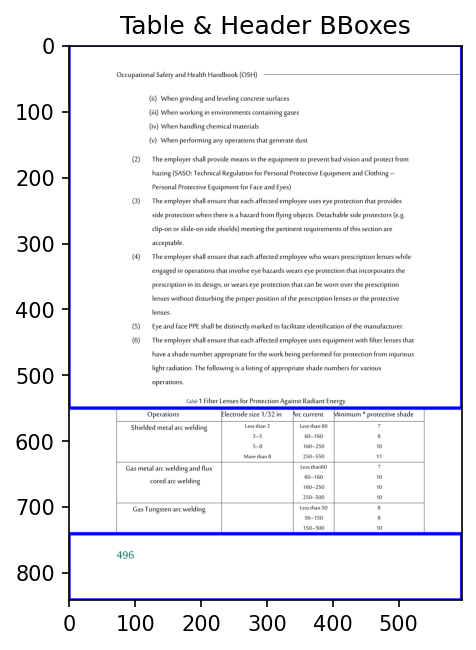

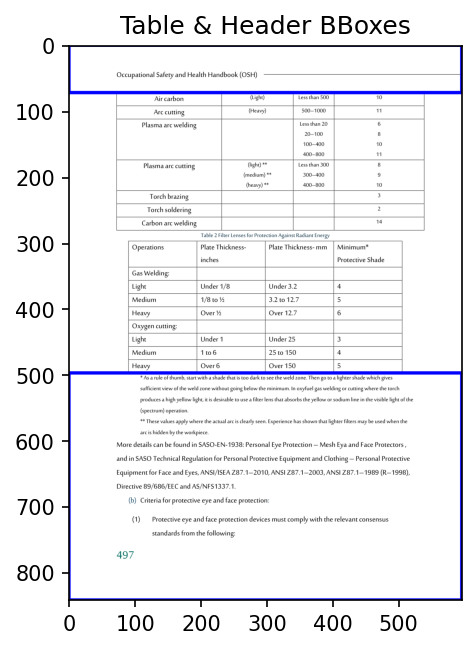

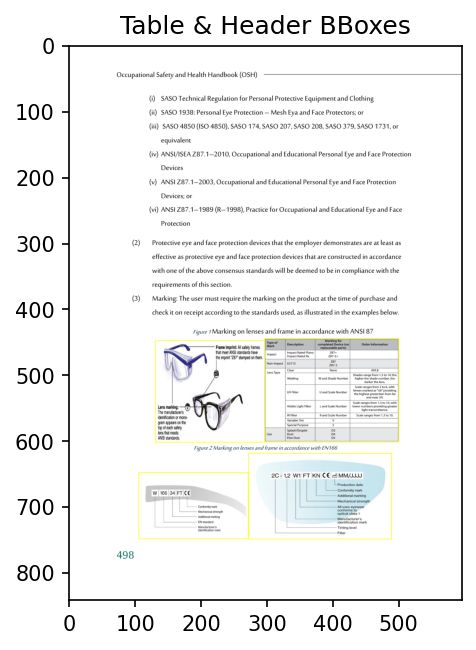

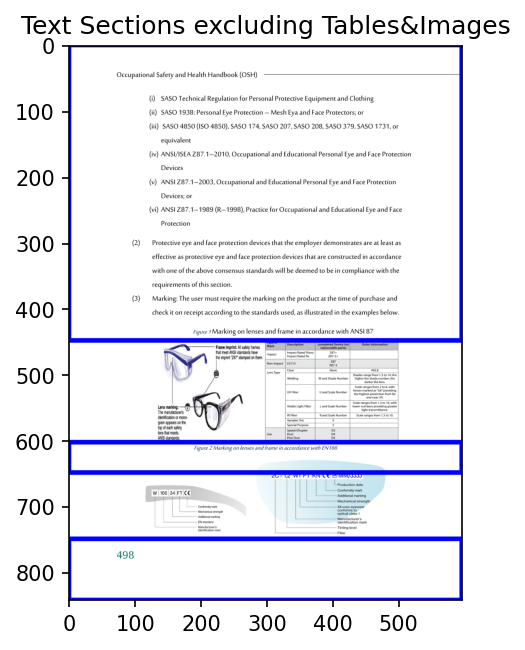

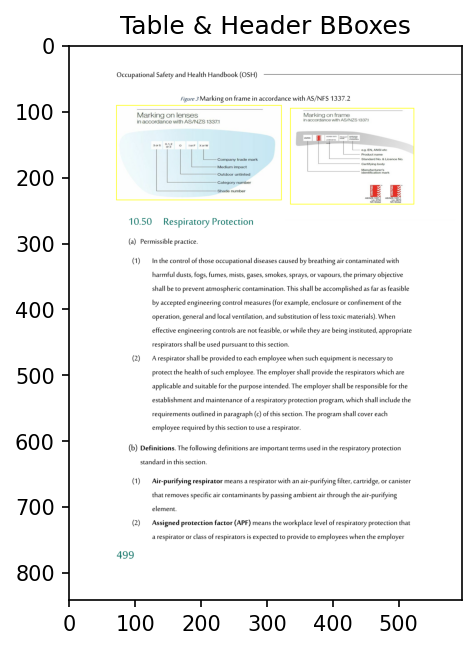

...

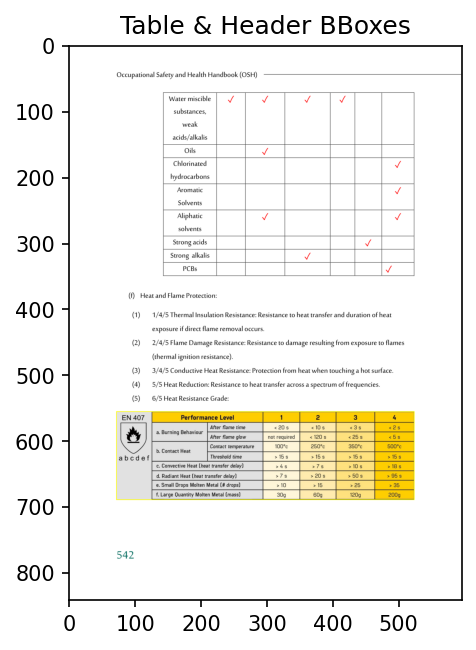

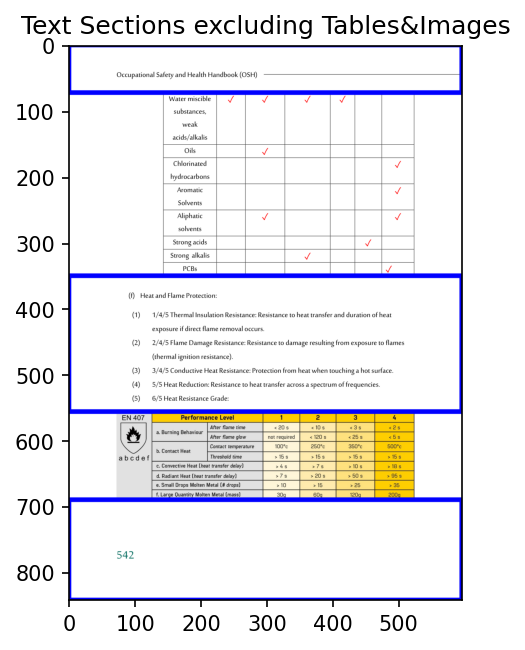

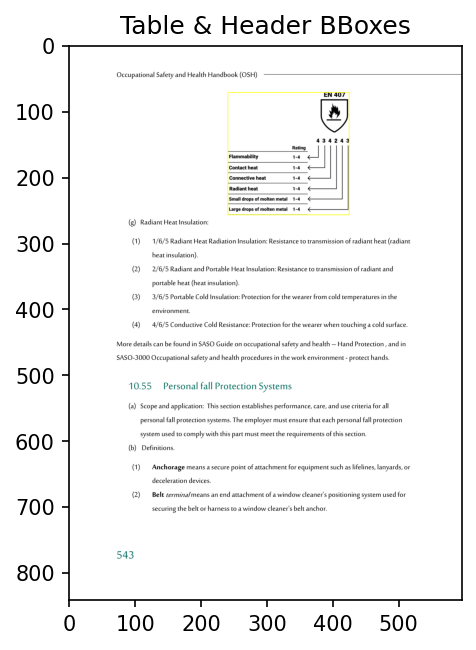

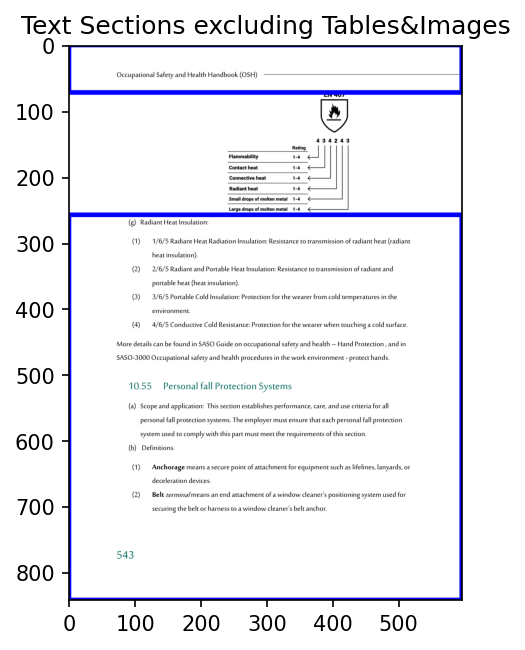

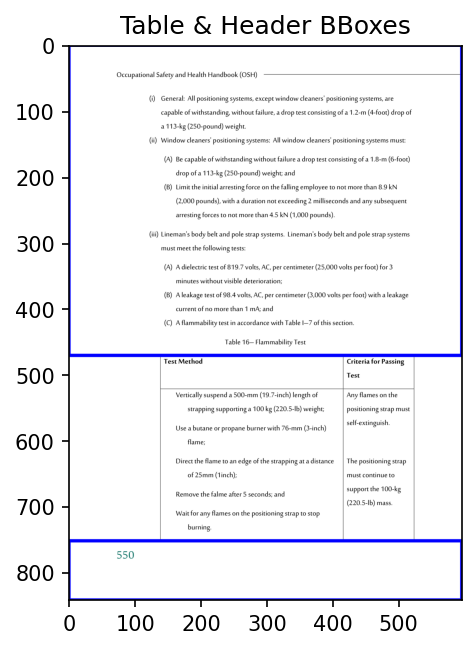

In [70]:
extract_text_grouped_by_font_size(DOC_PATH)

In [71]:
ppe_data_metadated

[{'page': 491,
  'page_contents': [{'chapter': '10.47 Compliance with regulations and standards ',
    'contents': ['Employers and employees shall adhere to the Saudi Labor Law, Modon: Safety and occupational health ',
     'guidelines, SASO-3001 Occupational safety and health procedures in the work environment - safety ',
     'helmet, SASO Guide on occupational safety and health – Safety Shoes, and in SASO-2992 Occupational ',
     'safety and health procedures in the work environment - safety shoes, SASO Technical Regulation for ',
     'Personal Protective Equipment and Clothing , SASO 1938 : Personal Eye Protection – Mesh Eya and Face ',
     'Protectors, SASO 174, SASO 207, SASO 208, SASO 379, SASO 1731, SASO Guide on occupational safety ',
     'and health – Hand Protection , SASO-3000 Occupational safety and health procedures in the work ',
     'environment - protect hands, NIOSH, ISO 4850, ANSI/ISEA Z87.1–2010, ANSI Z87.1–2003, ANSI ',
     'Z87.1–1989 (R–1998), ANSI/Compress

In [72]:
# import json
# # Specify the file name
# file_name = 'Correctdata_20_08_precleaning.json'

# # Save the list of dictionaries as a JSON file
# with open(file_name, 'w') as json_file:
#     json.dump(ppe_data_metadated, json_file, indent=4)

# print(f"List of dictionaries saved to {file_name}")

List of dictionaries saved to Correctdata_20_08_precleaning.json


# Final preprocessing

## Data Cleaning

In [25]:
import nltk
import string
import re

# Download stopwords from nltk
nltk.download('stopwords')
from nltk.corpus import stopwords

# Define the list of sentences
sentences = [
    "This is a sample sentence. :",
    "((TABLE))",
    "Another example, with punctuation!",
    "Cleaning the list from stop words and extra punctuation.",
    '(a)',
    '"A leakage test of 98.4 volts, AC, per centimeter (3,000 volts per foot) with a leakage ", 2/3/4'
]

# Define stop words and punctuation
stop_words = set(stopwords.words('english'))
punctuation = string.punctuation.replace('(', '').replace(')', '').replace('.', '').replace('/', '')

# Function to clean a sentence
def clean_sentence(sentence):
    # Remove punctuation except parentheses and periods within numbers
    sentence = re.sub(r'(?<!\d)\.(?!\d)', '', sentence)  # Remove periods not between numbers
    sentence = sentence.translate(str.maketrans('', '', punctuation))
    # Split sentence into words
    words = sentence.split()
    # Remove stop words
    cleaned_words = [word for word in words if word.lower() not in stop_words]
    # Join words back into a cleaned sentence
    cleaned_sentence = ' '.join(cleaned_words)
    # Remove extra spaces
    cleaned_sentence = re.sub(' +', ' ', cleaned_sentence).strip()
    return cleaned_sentence


# Clean all sentences in the list
cleaned_sentences = [clean_sentence(sentence) for sentence in sentences]

# Print cleaned sentences
for sentence in cleaned_sentences:
    print(sentence)


sample sentence
((TABLE))
Another example punctuation
Cleaning list stop words extra punctuation
(a)
leakage test 98.4 volts AC per centimeter (3000 volts per foot) leakage 2/3/4


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


## Final preparation

In [74]:
import re
import copy 


labeled_ppe_data =[]
'''[
{chapter : chapter,
sections : [
{section : a,
contents : [  ,  ,  ]},
image_path : [optional],
table_path:[optional]
}]
'''
ex_chapter=''
dictionnary=''
for page in ppe_data_metadated:

    for chapter in page['page_contents']: # Parse the chapters exiting in the page

        printt('dictionnary start'+str(dictionnary) ,'blue')
        printt(chapter['chapter'] == ex_chapter)

        chapter_data = {'page' : page['page'],
            'chapter' : chapter['chapter'],
                        'sections': []}
        
        if chapter['chapter'] != ex_chapter:
            dictionnary = {'section': '',
                            'contents' :[],
                            }
        else:
            dictionnary.update({'contents' :[]})# keep privious section
        
        printt('dictionnary'+str(dictionnary) )
        ex_chapter = chapter['chapter']


        for i, sentence in enumerate(chapter['contents']):
            if sentence == '((TABLE))':
                print(page['page'], sentence, chapter)
                print(5000*'-')
                pm = dc(chapter['table_path'][0])
                chapter['table_path'].pop(0)
                if 'table_path' not in dictionnary:
                    dictionnary.update({'table_path': [pm]})
                else:
                    dictionnary['table_path'].append(pm)
            elif sentence == '((IMAGE))':
                    pm = dc(chapter['image_path'][0])
                    chapter['image_path'].pop(0)
                    if 'image_path' not in dictionnary:
                        dictionnary.update({'image_path': [pm]})
                    else:
                        dictionnary['image_path'].append(pm)
                
            # If check the pattern, fill as metadata (a), (b)...
            paragraph_pattern = re.compile(r'(\([a-hj-u]\))')

            if re.match(paragraph_pattern, sentence) and len(sentence)< 4:
                # print('Section', clean_sentence(sentence))
                if dictionnary['contents'] != []:
                    # printt('filling the dict with'+ str(dictionnary), 'blue')
                    e = copy.deepcopy(dictionnary)
                    chapter_data['sections'].append(e)
                printt(sentence)
                dictionnary = {'section': clean_sentence(sentence),
                            'contents' :[]}
                continue
                
            dictionnary['contents'].append(sentence)

            if i == len(chapter['contents'])-1:
                printt('End of Loop')
                printt('filling the dict with'+ str(dictionnary), 'blue')

                e = copy.deepcopy(dictionnary)
                chapter_data['sections'].append(e)
        if 'image_path' in dictionnary:
            del dictionnary['image_path']
        if 'table_path' in dictionnary:
            del dictionnary['table_path']

                
        # printt('dictionnary end'+str(dictionnary) ,'green')
        labeled_ppe_data.append( chapter_data )


dictionnary start
False
dictionnary{'section': '', 'contents': []}
End of Loop
filling the dict with{'section': '', 'contents': ['Employers and employees shall adhere to the Saudi Labor Law, Modon: Safety and occupational health ', 'guidelines, SASO-3001 Occupational safety and health procedures in the work environment - safety ', 'helmet, SASO Guide on occupational safety and health – Safety Shoes, and in SASO-2992 Occupational ', 'safety and health procedures in the work environment - safety shoes, SASO Technical Regulation for ', 'Personal Protective Equipment and Clothing , SASO 1938 : Personal Eye Protection – Mesh Eya and Face ', 'Protectors, SASO 174, SASO 207, SASO 208, SASO 379, SASO 1731, SASO Guide on occupational safety ', 'and health – Hand Protection , SASO-3000 Occupational safety and health procedures in the work ', 'environment - protect hands, NIOSH, ISO 4850, ANSI/ISEA Z87.1–2010, ANSI Z87.1–2003, ANSI ', 'Z87.1–1989 (R–1998), ANSI/Compressed Gas Association Commodit

In [76]:
labeled_ppe_data

[{'page': 491,
  'chapter': '10.47 Compliance with regulations and standards ',
  'sections': [{'section': '',
    'contents': ['Employers and employees shall adhere to the Saudi Labor Law, Modon: Safety and occupational health ',
     'guidelines, SASO-3001 Occupational safety and health procedures in the work environment - safety ',
     'helmet, SASO Guide on occupational safety and health – Safety Shoes, and in SASO-2992 Occupational ',
     'safety and health procedures in the work environment - safety shoes, SASO Technical Regulation for ',
     'Personal Protective Equipment and Clothing , SASO 1938 : Personal Eye Protection – Mesh Eya and Face ',
     'Protectors, SASO 174, SASO 207, SASO 208, SASO 379, SASO 1731, SASO Guide on occupational safety ',
     'and health – Hand Protection , SASO-3000 Occupational safety and health procedures in the work ',
     'environment - protect hands, NIOSH, ISO 4850, ANSI/ISEA Z87.1–2010, ANSI Z87.1–2003, ANSI ',
     'Z87.1–1989 (R–1998), A

In [77]:
# Drop strings

D = 'Occupational Safety and Health Handbook (OSH) '
for d in labeled_ppe_data:
    for section_content in  d['sections']:
        section_content.update({'combined content' :' '.join(section_content['contents']).replace(D,'').strip()})


In [79]:
import json
# Specify the file name
file_name = '20_08_text_metadata_tables&images_LABELED_PREFINAL.json'

# Save the list of dictionaries as a JSON file
with open(file_name, 'w') as json_file:
    json.dump(labeled_ppe_data, json_file, indent=4)

print(f"List of dictionaries saved to {file_name}")

List of dictionaries saved to 20_08_text_metadata_tables&images_LABELED_PREFINAL.json


## Decomposition into sections (a, b, c)

In [85]:
def count_words(text):
    return len(text.split())
import copy
# data = copy.deepcopy(labeled_ppe_data)
current_chapter = ''
formated_metadata =[]
dictionnary = {
        'chapter': '',
        'sections':[]
    } # For Each Chapter

for x in labeled_ppe_data:
    # print('current_chapter',current_chapter , "'x['chapter']'",x['chapter'] )
    # print(current_chapter == x['chapter'])
    if current_chapter == x['chapter'] :
        # print('holla')
        sections = [sec['section'] for sec in dictionnary['sections']]
        formated_metadata.pop()#Remove the appended uncomplete chapter
        page = copy.deepcopy(x['page'])
        for content in x['sections']: # Parsing multiple sections in the page

            try : # Searching for already existing sections in the chapter 
                index = sections.index(content['section'])
                # print(dictionnary['sections'][index]['content'])
                dictionnary['sections'][index]['content'] += clean_sentence(content['combined content']) 
                dictionnary['sections'][index]['pages'].append(page)
                # print(dictionnary['sections'][index]['content'])
            except:
                print('Same Chapter,new section')
                content_dictionnary = {
                    'section' : content['section'],
                    'pages':[page],
                    'content': clean_sentence(content['combined content'])
                }

                if 'image_path' in content:
                    content_dictionnary.update({'image_path': content['image_path']})
                if 'table_path' in content:
                    content_dictionnary.update({'table_path': content['table_path']})
                    
                dictionnary['sections'].append(content_dictionnary)

        formated_metadata.append(dictionnary)

    else:

        dictionnary = {
            'chapter': x['chapter'],
            'sections':[]
        } # For Each Chapter


        for content in x['sections']:
            content_dictionnary = {
                'section' : '',
                'pages':[],
                'content': ''
            }
            content_dictionnary['section'] = content['section']
            content_dictionnary['pages'].append(x['page'])
            content_dictionnary['content'] = clean_sentence(content['combined content']) 

            ddd = copy.deepcopy(content_dictionnary) #Very crucial
            dictionnary['sections'].append(ddd)

        formated_metadata.append(dictionnary) # Assuming we finished the chapter 
    print('dictionnary', dictionnary)
    current_chapter = x['chapter']

dictionnary {'chapter': '10.47 Compliance with regulations and standards ', 'sections': [{'section': '', 'pages': [491], 'content': 'Employers employees shall adhere Saudi Labor Law Modon Safety occupational health guidelines SASO3001 Occupational safety health procedures work environment safety helmet SASO Guide occupational safety health – Safety Shoes SASO2992 Occupational safety health procedures work environment safety shoes SASO Technical Regulation Personal Protective Equipment Clothing SASO 1938 Personal Eye Protection – Mesh Eya Face Protectors SASO 174 SASO 207 SASO 208 SASO 379 SASO 1731 SASO Guide occupational safety health – Hand Protection SASO3000 Occupational safety health procedures work environment protect hands NIOSH ISO 4850 ANSI/ISEA Z87.1–2010 ANSI Z87.1–2003 ANSI Z87.1–1989 (R–1998) ANSI/Compressed Gas Association Commodity Specification Air G–7.1– 1989 ANSI Z89.1–2009 ANSI Z89.1–2003 ANSI Z89.1–1997 ANSI Z41–1999 ANSI Z41–1991 ASTM F–2412–2005 ASTM D120–09 ASTM 

In [86]:
for dd in formated_metadata:
    for d in dd['sections']:
        d['section'] = d['section'].replace('(', '').replace(')', '')

In [87]:
formated_metadata

[{'chapter': '10.47 Compliance with regulations and standards ',
  'sections': [{'section': '',
    'pages': [491, 492, 493],
    'content': 'Employers employees shall adhere Saudi Labor Law Modon Safety occupational health guidelines SASO3001 Occupational safety health procedures work environment safety helmet SASO Guide occupational safety health – Safety Shoes SASO2992 Occupational safety health procedures work environment safety shoes SASO Technical Regulation Personal Protective Equipment Clothing SASO 1938 Personal Eye Protection – Mesh Eya Face Protectors SASO 174 SASO 207 SASO 208 SASO 379 SASO 1731 SASO Guide occupational safety health – Hand Protection SASO3000 Occupational safety health procedures work environment protect hands NIOSH ISO 4850 ANSI/ISEA Z87.1–2010 ANSI Z87.1–2003 ANSI Z87.1–1989 (R–1998) ANSI/Compressed Gas Association Commodity Specification Air G–7.1– 1989 ANSI Z89.1–2009 ANSI Z89.1–2003 ANSI Z89.1–1997 ANSI Z41–1999 ANSI Z41–1991 ASTM F–2412–2005 ASTM D120

## Saving Data

In [88]:
# import json
# # Specify the file name
# file_name = '20_08_text_metadata_tables&images.json'

# # Save the list of dictionaries as a JSON file
# with open(file_name, 'w') as json_file:
#     json.dump(formated_metadata, json_file, indent=4)

# print(f"List of dictionaries saved to {file_name}")

List of dictionaries saved to 20_08_text_metadata_tables&images.json


# Correcting data

In [1]:
import json

data = open(r'C:\Users\YoussefGHAOUI\Documents\tmp\CleanNotebooks\20_08_text_metadata_tables&images_LABELED_PREFINAL.json')
data = json.load(data)


In [2]:
'table_path' in data[34]['sections'][0]

True

In [6]:
from copy import deepcopy as dc
for id1, c in enumerate(data):
    # print(c['page'])
    for id2, sec in enumerate(c['sections']):
        if 'image_path' in sec:
            if len(sec['image_path'])==1:
                tt = dc(sec['image_path'][0])
                sec['image_path']= [tt.replace('_1','')]
                
        if 'table_path' in sec and (len(sec['table_path']) > 1):
            print(sec['table_path'])
            print(f'[{id1}][{id2}]')

                

['32.txt', '32.txt']
[34][0]
['46.txt', '46.txt', '46.txt']
[51][0]
['47.txt', '47.txt']
[52][0]


* Correction of images and images path done

In [26]:
for id1, c in enumerate(data):
    # print(c['page'])
    for id2, sec in enumerate(c['sections']):
        z = dc(sec['combined content'] )
        sec['combined content'] = clean_sentence(z)


In [30]:
back_data = dc(data)

for id1, c in enumerate(back_data):
    # print(c['page'])
    for id2, sec in enumerate(c['sections']):
        if sec['combined content'] =="":
            data[id1]['sections'].pop(id2)
            if data[id1]['sections'] ==[]:
                data.pop(id1)

In [33]:
for id1, c in enumerate(data):
    # print(c['page'])
    for id2, sec in enumerate(c['sections']):
        del sec['contents']

In [34]:
# import json
# # Specify the file name
# file_name = 'finaldata.json'

# # Save the list of dictionaries as a JSON file
# with open(file_name, 'w') as json_file:
#     json.dump(data, json_file, indent=4)

# print(f"List of dictionaries saved to {file_name}")

List of dictionaries saved to finaldata.json


# Smaller subchunking splitting

In [144]:
import json

file = open(('/notebooks/finaldata.json'))
final_data = json.load(file)
final_data_copy = dc(final_data)
final_data

[{'page': 491,
  'chapter': '10.47 Compliance with regulations and standards ',
  'sections': [{'section': '',
    'combined content': 'Employers employees shall adhere Saudi Labor Law Modon Safety occupational health guidelines SASO3001 Occupational safety health procedures work environment safety helmet SASO Guide occupational safety health – Safety Shoes SASO2992 Occupational safety health procedures work environment safety shoes SASO Technical Regulation Personal Protective Equipment Clothing SASO 1938 Personal Eye Protection – Mesh Eya Face Protectors SASO 174 SASO 207 SASO 208 SASO 379 SASO 1731 SASO Guide occupational safety health – Hand Protection SASO3000 Occupational safety health procedures work environment protect hands NIOSH ISO 4850 ANSI/ISEA Z87.1–2010 ANSI Z87.1–2003 ANSI Z87.1–1989 (R–1998) ANSI/Compressed Gas Association Commodity Specification Air G–7.1– 1989 ANSI Z89.1–2009 ANSI Z89.1–2003 ANSI Z89.1–1997 ANSI Z41–1999 ANSI Z41–1991 ASTM F–2412–2005 ASTM D120–09 AS

* Remove empty combined content

In [145]:
for page in final_data:
    for idd, section in enumerate(page['sections']): # Parse the chapters exiting in the page
        if section['combined content'] == '':
            printt(f'Page {page["page"]}','blue')
            printt(f'Section{section["section"]}')

* Done Manually

In [146]:
page,section

({'page': 552,
  'chapter': '10.55 Personal fall Protection Systems ',
  'sections': [{'section': '(e)',
    'combined content': '(xi) Except provided paragraph (d)(2)(xii) section employee travels one window another returning inside window opening repeating belt terminal attachment procedure window accordance paragraph (d)(2)(x) section (xii) employee using window cleaners positioning system may travel one window another outside building provided (A) least one belt terminal attached window anchor times (B) distance window anchors exceed 1.2 (4 feet) horizontally distance windows may increased 1.8 (6 feet) horizontally windowsill ledge least 0.31 (1 foot) wide slope less 5 degrees (C) sill ledge windows continuous (D) width windowsill ledge front mullions least 15.2 cm (6 inches) wide'}]},
 {'section': '(e)',
  'combined content': '(xi) Except provided paragraph (d)(2)(xii) section employee travels one window another returning inside window opening repeating belt terminal attachment pr

In [147]:
import re

# Regular expression pattern to match valid subsections with one or two digits,
# ensuring no preceding closing bracket before the opening parenthesis
paragraph_pattern = re.compile(r'(?<!\))\(\d{1,2}\)\s')

# Example sentences
sentence = """
(1) Valid section one.
 (1) Except provided paragraphs (g)(2) (g)(6) section prot
(100) This should be invalid.
(99) Valid section ninety-nine.
)(2) This should be invalid.
"""

# Find all subsections in the sentence
subsection_list = paragraph_pattern.findall(sentence)
print("Found subsections:", subsection_list)



Found subsections: ['(1) ', '(1) ', '(99) ']


In [148]:
result_pattern

'(?<!\\))\\(1)'

In [151]:
import re
from copy import deepcopy as dc


labeled_ppe_data =[]
'''[
{'page': 543,
chapter : chapter,
sections : [
{section : a,
subsection : 1,
contents : [  ,  ,  ]},
image_path : [optional],
table_path:[optional]
}]
'''
ex_section =''
dictionnary=''



for page_id, page in enumerate(final_data_copy):
    printt(f'Page {page["page"]}','blue')

    for section_id, section in enumerate(page['sections']): # Parse the chapters exiting in the page
        if section['section']!=ex_subsection:
            ex_subsection =''
        printt(f'Section{section["section"]}', 'blue')
        printt(section["section"] == ex_section)
        sentence = section['combined content']
        printt(sentence, 'yellow')

        # If check the pattern, fill as metadata (1), (2)...
        paragraph_pattern = re.compile(r'(?<!\))\(\d{1,2}\)\s')
        new_dict_section_list = []

        subsection_list = paragraph_pattern.findall(sentence)
        print(subsection_list)
        
        # Removing wrong mapping (1) inside text , come after (4) and we usually use ()(2) when refrence inside text 
        if ex_subsection!='':
            print(int(ex_subsection.replace('(','').replace(')','')))
            condition = int(ex_subsection.replace('(','').replace(')','')) 
            subsection_list = [x for x in subsection_list if (int(x.replace('(','').replace(')','')) >  condition)]
        if subsection_list!=[]: #['\n(1) ', ' (2) ', ' (3) ']

            result_pattern = '|'.join([f"(?<!\\))\\{x.strip()[:-1]}\\)" for x in subsection_list])
            
            # Output the result
            print("Regex pattern:", result_pattern)

            # Compile the combined pattern
            split_pattern = re.compile(result_pattern)

            # Split the string
            subcontents = split_pattern.split(sentence)
            print(subcontents, 'cyan')
            if len(subcontents) == len(subsection_list)+1:
                subsection_list.insert(0, ex_chapter)

            for subsection, subcontent in zip(subsection_list, subcontents):

                dictionnary = {'section':clean_sentence(section['section']),
                               'subsection': clean_sentence(subsection),
                               'combined content': subcontent}
                
                nb_tables = subcontent.count('((TABLE))')
                nb_images = subcontent.count('((IMAGE))')
                tables = []
                images = [] 
                    
                if nb_tables > 0 :
                    for _ in range(nb_tables):
                        printt(section['table_path'])
                        print(section)
                        tables.append(section['table_path'].pop(0))
                    tt = dc(tables)
                    dictionnary.update({'table_path': tt})
                
                if nb_images > 0 :
                    for _ in range(nb_images):
                        images.append(section['image_path'].pop(0))
                    ii = dc(images)
                    dictionnary.update({'image_path': ii})

                e = dc(dictionnary)
                new_dict_section_list.append(e) # add each subsection

            
            ex_subsection = subsection
        else: # No subsections
            if ex_section != section['section'] : # e.g. : New section (d) without subsection, means subsection is ''
                ex_subsection = ''
            
            section.update({'section':clean_sentence(section['section']),
                            'subsection':ex_subsection})

            new_dict_section_list.append(section)
        ex_section = section["section"]

    fff = dc(new_dict_section_list)
    final_data[page_id].update({'sections':fff})

                


Page 491
Section
True
Employers employees shall adhere Saudi Labor Law Modon Safety occupational health guidelines SASO3001 Occupational safety health procedures work environment safety helmet SASO Guide occupational safety health – Safety Shoes SASO2992 Occupational safety health procedures work environment safety shoes SASO Technical Regulation Personal Protective Equipment Clothing SASO 1938 Personal Eye Protection – Mesh Eya Face Protectors SASO 174 SASO 207 SASO 208 SASO 379 SASO 1731 SASO Guide occupational safety health – Hand Protection SASO3000 Occupational safety health procedures work environment protect hands NIOSH ISO 4850 ANSI/ISEA Z87.1–2010 ANSI Z87.1–2003 ANSI Z87.1–1989 (R–1998) ANSI/Compressed Gas Association Commodity Specification Air G–7.1– 1989 ANSI Z89.1–2009 ANSI Z89.1–2003 ANSI Z89.1–1997 ANSI Z41–1999 ANSI Z41–1991 ASTM F–2412–2005 ASTM D120–09 ASTM D178–01(2010) ASTM D1048–12 ASTM D1049– 98(2010) ASTM D1050–05(2011) ASTM D1051–08 ASTM F1236–96 (2012) ASTM F8

In [78]:
ex_subsection

''

In [153]:
final_data

[{'page': 491,
  'chapter': '10.47 Compliance with regulations and standards ',
  'sections': [{'section': '',
    'combined content': 'Employers employees shall adhere Saudi Labor Law Modon Safety occupational health guidelines SASO3001 Occupational safety health procedures work environment safety helmet SASO Guide occupational safety health – Safety Shoes SASO2992 Occupational safety health procedures work environment safety shoes SASO Technical Regulation Personal Protective Equipment Clothing SASO 1938 Personal Eye Protection – Mesh Eya Face Protectors SASO 174 SASO 207 SASO 208 SASO 379 SASO 1731 SASO Guide occupational safety health – Hand Protection SASO3000 Occupational safety health procedures work environment protect hands NIOSH ISO 4850 ANSI/ISEA Z87.1–2010 ANSI Z87.1–2003 ANSI Z87.1–1989 (R–1998) ANSI/Compressed Gas Association Commodity Specification Air G–7.1– 1989 ANSI Z89.1–2009 ANSI Z89.1–2003 ANSI Z89.1–1997 ANSI Z41–1999 ANSI Z41–1991 ASTM F–2412–2005 ASTM D120–09 AS

In [154]:
# import json
# # Specify the file name
# file_name = 'FinalDataSubchunked.json'

# # Save the list of dictionaries as a JSON file
# with open(file_name, 'w') as json_file:
#     json.dump(final_data, json_file, indent=4)

# print(f"List of dictionaries saved to {file_name}")

List of dictionaries saved to FinalDataSubchunked.json


# Data tuning

* We encoutered some cases where we have very small chunks in a certain section in a page, therefore we need to fix that by adding that section to the next chunk if it belongs to the same section, otherwise the the one before it.


In [3]:
from transformers import AutoTokenizer, AutoModel
tokenizer_dragon_RoBERTa = AutoTokenizer.from_pretrained('facebook/dragon-plus-context-encoder')

encodeds = tokenizer_dragon_RoBERTa('ISO11393 SASO ISO 11612 IS014116 ISO710 ISO3873 ISO20471 ISO16321 ISO19734 ISO4007ISO12312 ISO18527 ISO12401ISO20471ISO14116 ISO150225 ISO11611 IEC6182 IEC61482 EN166 EN149 EN13034 EN13758 ISO11393 ISO13998 ISO27065 EN352 ISO4869 EN60903 EN60903 ISO21420 IEC61482 ISO15797 ISO20471 AS/NFS13371 Directive 89/686/EECAnd occupational safety health regulations issued Kingdom stipulate need use personal protective equipment', return_tensors="pt", add_special_tokens=True).to('cuda')  # Tokenizes the prompt
# Print the length of the tokenized prompt
print(f"The prompt length is: {encodeds['input_ids'].size(1)}")

/usr/local/lib/python3.11/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


The prompt length is: 165


In [27]:
import json

data_ = open(r'/notebooks/finaldata.json')
data_ = json.load(data_)

In [84]:
data[chunk_index]['sections']

[]

In [42]:
from copy import deepcopy as dc

# Assuming `data_` is defined elsewhere
data = dc(data_)  # Creating a deep copy of the original data

# To avoid issues with modifying the list while iterating, we'll collect indices to delete later
indices_to_delete = []

for chunk_index, chunk in enumerate(data):
    encodeds = tokenizer_dragon_RoBERTa(chunk['sections'][-1]['combined content'], return_tensors="pt").to('cuda')  # Tokenizes the prompt
    
    if encodeds['input_ids'].size(1) < 50:
        print(chunk['sections'][-1]['combined content'])

        # Handle combining content with the next chunk
        if chunk_index + 1 < len(data) and data[chunk_index + 1]['sections'][-1]['section'] == chunk['sections'][-1]['section']:
            data[chunk_index + 1]['sections'][-1]['combined content'] = (
                chunk['sections'][-1]['combined content'] + ' ' + data[chunk_index + 1]['sections'][-1]['combined content']
            )
            indices_to_delete.append(chunk_index)

        # Handle combining content with the previous chunk
        elif chunk_index > 0 and len(chunk['sections']) == 1 and data[chunk_index - 1]['sections'][0]['section'] == chunk['sections'][-1]['section']:
            data[chunk_index - 1]['sections'][0]['combined content'] = (
                chunk['sections'][-1]['combined content'] + ' ' + data[chunk_index - 1]['sections'][-1]['combined content']
            )
            indices_to_delete.append(chunk_index)

# Remove the chunks marked for deletion, going in reverse order to maintain correct indices
for index in indices_to_delete:
    print('to delete', data[index]['sections'][-1])
    RR  = dc(data[index]['sections'][:-1])
    print(RR)
    data[index].update({'sections': })
    


SyntaxError: expression expected after dictionary key and ':' (3852892130.py, line 34)

In [39]:
data

[{'page': 491,
  'chapter': '10.47 Compliance with regulations and standards ',
  'sections': [{'section': '',
    'combined content': 'Employers employees shall adhere Saudi Labor Law Modon Safety occupational health guidelines SASO3001 Occupational safety health procedures work environment safety helmet SASO Guide occupational safety health – Safety Shoes SASO2992 Occupational safety health procedures work environment safety shoes SASO Technical Regulation Personal Protective Equipment Clothing SASO 1938 Personal Eye Protection – Mesh Eya Face Protectors SASO 174 SASO 207 SASO 208 SASO 379 SASO 1731 SASO Guide occupational safety health – Hand Protection SASO3000 Occupational safety health procedures work environment protect hands NIOSH ISO 4850 ANSI/ISEA Z87.1–2010 ANSI Z87.1–2003 ANSI Z87.1–1989 (R–1998) ANSI/Compressed Gas Association Commodity Specification Air G–7.1– 1989 ANSI Z89.1–2009 ANSI Z89.1–2003 ANSI Z89.1–1997 ANSI Z41–1999 ANSI Z41–1991 ASTM F–2412–2005 ASTM D120–09 AS

# Chroma VectorDB


In [1]:
pip install chromadb==0.5.3

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.3/67.3 kB 4.4 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.4/50.4 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 559.5/559.5 kB 7.9 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 15.9 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 273.8/273.8 kB 20.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.2/93.2 kB 16.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 15.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 18.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 28.6 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 16.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1

In [1]:
import nltk
import string
import re

# Download stopwords from nltk
nltk.download('stopwords')
from nltk.corpus import stopwords

# Define the list of sentences
sentences = [
    "This is a sample sentence. :",
    "((TABLE))",
    "Another example, with punctuation!",
    "Cleaning the list from stop words and extra punctuation.",
    '(a)',
    '"A leakage test of 98.4 volts, AC, per centimeter (3,000 volts per foot) with a leakage ", 2/3/4'
]

# Define stop words and punctuation
stop_words = set(stopwords.words('english'))
punctuation = string.punctuation.replace('(', '').replace(')', '').replace('.', '').replace('/', '')

# Function to clean a sentence
def clean_sentence(sentence):
    # Remove punctuation except parentheses and periods within numbers
    sentence = re.sub(r'(?<!\d)\.(?!\d)', '', sentence)  # Remove periods not between numbers
    sentence = sentence.translate(str.maketrans('', '', punctuation))
    # Split sentence into words
    words = sentence.split()
    # Remove stop words
    cleaned_words = [word for word in words if word.lower() not in stop_words]
    # Join words back into a cleaned sentence
    cleaned_sentence = ' '.join(cleaned_words)
    # Remove extra spaces
    cleaned_sentence = re.sub(' +', ' ', cleaned_sentence).strip()
    return cleaned_sentence


# Clean all sentences in the list
cleaned_sentences = [clean_sentence(sentence) for sentence in sentences]

# Print cleaned sentences
for sentence in cleaned_sentences:
    print(sentence)


sample sentence
((TABLE))
Another example punctuation
Cleaning list stop words extra punctuation
(a)
leakage test 98.4 volts AC per centimeter (3000 volts per foot) leakage 2/3/4


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [2]:
from copy import deepcopy as dc

In [3]:
import json

data = open(r'/notebooks/finaldata.json')
data = json.load(data)

In [156]:
from transformers import AutoTokenizer, AutoModel
from chromadb import Documents, EmbeddingFunction, Embeddings
from typing import List, cast

class DragonEmbeddingFunction(EmbeddingFunction):
    '''
    You can use either 'facebook/dragon-plus-context-encoder' or 'facebook/dragon-roberta-context-encoder'
    '''
    def __init__(self, model_name='facebook/dragon-plus-context-encoder', tokenizer_name='facebook/dragon-plus-context-encoder'):
        self.model = AutoModel.from_pretrained(model_name)
        self.tokenizer = AutoTokenizer.from_pretrained(tokenizer_name) 

    def __call__(self, input: Documents) -> Embeddings:
        # Flatten the input list if it contains nested lists
        input_texts = [item for sublist in input for item in sublist] if isinstance(input[0], list) else input
        
        # Tokenize the batch of documents
        encoded_input = self.tokenizer.batch_encode_plus(
            input_texts, 
            add_special_tokens=True, 
            return_tensors="pt", 
            padding=True, 
            truncation=True,
            max_length=512  
        )
        
        # Generate embeddings
        with torch.no_grad():
            model_output = self.model(**encoded_input)
        
        # Take the mean of the last hidden state to get a fixed-size vector for each document
        embeddings = model_output.last_hidden_state.mean(dim=1).numpy().tolist()
        
        # Return the embeddings as a list of lists
        return cast(Embeddings, embeddings)


In [3]:
import torch
embed_fn = DragonEmbeddingFunction()

embed_fn(["foo"])

[[-0.679224967956543,
  0.23330466449260712,
  2.233751058578491,
  -1.0320709943771362,
  2.763424873352051,
  0.6460105776786804,
  2.7208683490753174,
  0.6835405230522156,
  -1.0799659490585327,
  -3.4455230236053467,
  -1.5276893377304077,
  1.298728108406067,
  -3.324519157409668,
  2.3622591495513916,
  -0.38027724623680115,
  3.3574655055999756,
  3.8878793716430664,
  1.060353398323059,
  1.2497992515563965,
  -1.8120635747909546,
  -0.0031918783206492662,
  -1.3934378623962402,
  2.7027130126953125,
  0.716536283493042,
  1.4764708280563354,
  0.9302000403404236,
  2.611894369125366,
  -0.47057998180389404,
  -3.597292184829712,
  2.1406381130218506,
  2.1890971660614014,
  0.372432678937912,
  3.0205278396606445,
  -1.972386360168457,
  -2.6383798122406006,
  1.3841031789779663,
  -2.6676876544952393,
  -1.3880172967910767,
  -0.8410818576812744,
  -2.4114246368408203,
  -1.0241395235061646,
  -2.639165163040161,
  -2.114142656326294,
  0.4638167917728424,
  -2.4614639282226

In [16]:
import chromadb

# Initialize the ChromaDB client
chroma_client = chromadb.PersistentClient(path="./chroma_db")

# List existing collections
existing_collections = chroma_client.list_collections()

# Print and delete each existing collection
for collection in existing_collections:
    print(f"Deleting collection: {collection.name}")
    # chroma_client.delete_collection(name=collection.name)

print("All existing collections have been deleted.")


Deleting collection: Content_PPE_db
All existing collections have been deleted.


In [5]:
import chromadb
from chromadb.utils import embedding_functions
default_ef = embedding_functions.DefaultEmbeddingFunction()

# Initialize the ChromaDB client
chroma_client = chromadb.PersistentClient(path="./chroma_db")

embed_fn = DragonEmbeddingFunction()
# List existing collections
existing_collections = chroma_client.list_collections()

# Print the names of the existing collections
print("Existing collections:", [collection.name for collection in existing_collections])

# Create a new collection if it doesn't already exist
if "Content_PPE_db" not in [collection.name for collection in existing_collections]:
    collection = chroma_client.create_collection(name="Content_PPE_db",embedding_function=embed_fn)
    print(f"Collection 'Content_PPE_db' created.")
else:
    print(f"Collection 'Content_PPE_db' already exists.")


Existing collections: ['Content_PPE_db_ModifiedFormat', 'Content_PPE_db']
Collection 'Content_PPE_db' already exists.


/usr/local/lib/python3.11/dist-packages/torch/_utils.py:831: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  return self.fget.__get__(instance, owner)()
/usr/local/lib/python3.11/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


In [34]:
len(data[-1]['sections'])

1

In [19]:
import torch
i=0
collection = chroma_client.get_collection('Content_PPE_db', embedding_function=embed_fn
)
def insert_into_chroma(chapter, page, sections):
    global i
    
    for section in sections:
        i+=1
        metadatas = {"reference": f"Chapter {clean_sentence(chapter)}, section {section['section']}, Page {page}"}
        if 'table_path' in section:
            metadatas.update({"table_exist":True})
            for iii, table in enumerate(section['table_path']):
                metadatas.update({f"table_{iii}":table})
        else:
            metadatas.update({"table_exist":False})

        if 'image_path' in section:
            metadatas.update({"image_exist" : True})
            for ii, image in enumerate(section['image_path']):
                metadatas.update({f"image_{ii}":image})
        else:
            metadatas.update({"image_exist" : False})

        collection.add(
            documents=[section['combined content']],
            ids=[f'id{i}'],  # Unique ID
            metadatas=metadatas
        )

# # Example data

# data = [
#     {
#         "chapter": "10.47 Compliance with regulations and standards",
#         "sections": [
#             {
#                 "section": "",
#                 "pages":  492,
#                 "content": "Employers and employees shall adhere to the Saudi Labor Law...",
#                 "summarized_content": "Employers and employees must adhere to a comprehensive list..."
#             }
#         ]
#     }
    
# ]

# Insert all data into Chroma
for item in data:
    print(i)
    insert_into_chroma(item['chapter'], item['page'], item['sections'])


0
1
2
6
9
10
11
13
14
15
16
17
18
20
21
23
24
25
26
28
29
30
32
34
35
37
38
39
40
43
45
47
49
50
52
53
55
58
61
63
64
65
66
69
70
71
72
73
74
76
77
80
81
83
84
86
87
88
89
90
91
94
95
96


In [20]:
collection.get()

{'ids': ['id1',
  'id10',
  'id11',
  'id12',
  'id13',
  'id14',
  'id15',
  'id16',
  'id17',
  'id18',
  'id19',
  'id2',
  'id20',
  'id21',
  'id22',
  'id23',
  'id24',
  'id25',
  'id26',
  'id27',
  'id28',
  'id29',
  'id3',
  'id30',
  'id31',
  'id32',
  'id33',
  'id34',
  'id35',
  'id36',
  'id37',
  'id38',
  'id39',
  'id4',
  'id40',
  'id41',
  'id42',
  'id43',
  'id44',
  'id45',
  'id46',
  'id47',
  'id48',
  'id49',
  'id5',
  'id50',
  'id51',
  'id52',
  'id53',
  'id54',
  'id55',
  'id56',
  'id57',
  'id58',
  'id59',
  'id6',
  'id60',
  'id61',
  'id62',
  'id63',
  'id64',
  'id65',
  'id66',
  'id67',
  'id68',
  'id69',
  'id7',
  'id70',
  'id71',
  'id72',
  'id73',
  'id74',
  'id75',
  'id76',
  'id77',
  'id78',
  'id79',
  'id8',
  'id80',
  'id81',
  'id82',
  'id83',
  'id84',
  'id85',
  'id86',
  'id87',
  'id88',
  'id89',
  'id9',
  'id90',
  'id91',
  'id92',
  'id93',
  'id94',
  'id95',
  'id96',
  'id97'],
 'embeddings': None,
 'metadata

In [14]:
def replace_table_placeholders(paragraph, replacement):
    count = 0
    result_str = paragraph

    while '((TABLE))' in result_str:
            result_str = result_str.replace('((TABLE))', replacement, 1)
            count += 1
    return result_str

paragraph = "This is ((TABLE)) and here is another ((TABLE)), followed by the final ((TABLE))."




In [19]:
QUERY = 'What is the oxygen level threshold at an altitude of less than 3,001 ft for safe use of atmosphere-supplying respirators?'

In [20]:
def process_documents(collection, query_text=QUERY, n_results=3, max_tables=10):
    # Query the collection
    results = collection.query(
        query_texts=[query_text],  # Chroma will embed this for you
        n_results=n_results  # Number of results to return
    )
    
    # Iterate over the results and process each document
    for meta, doc in zip(results["metadatas"][0], results["documents"][0]):
        # print('meta', meta)
        
        if meta.get('table_exist', False):  # Check if 'table_exist' is True
            i = 0
            while f'table_{i}' in meta:
                # Specify the path to your .txt file
                file_path = f'/notebooks/tablesGPTformat/table{meta[f"table_{i}"]}'
                
                # Open the file and read its content
                with open(file_path, 'r', encoding='utf-8') as file:
                    text_content = file.read()
                
                # Replace the table placeholders in the document
                doc = replace_table_placeholders(doc, text_content)
                
                i += 1
                if i >= max_tables:  # Limit to max_tables to avoid excessive looping
                    break
        printt(meta['reference'])
        # Print the processed document
        print(doc)

# Example usage
# Assuming `collection` is already defined and `replace_table_placeholders` is implemented
process_documents(collection)


Chapter 10.50 Respiratory Protection, section (h), Page 517
(1) employer shall ensure compressed air compressed oxygen liquid air liquid oxygen used respiration accords following specifications (2) Compressed liquid oxygen shall meet United States Pharmacopoeia requirements medical breathing oxygen Compressed breathing air shall meet least requirements Grade breathing air described ANSI/Compressed Gas Association Commodity Specification Air G–7.1– 1989 include (A) Oxygen content (v/v) 19.5–23.5 (B) Hydrocarbon (condensed) content 5 milligrams per cubic meter air less (C) Carbon monoxide (CO) content 10 ppm less (D) Carbon dioxide content 1000 ppm less (E) Lack noticeable odor (3) employer shall ensure compressed oxygen used atmospheresupplying respirators previously used compressed air (4) employer shall ensure oxygen concentrations greater 23.5 used equipment designed oxygen service distribution (5) employer shall ensure cylinders used supply breathing air respirators meet following r

In [1]:
'''    def get(
        self,
        ids: Optional[OneOrMany[ID]] = None,
        where: Optional[Where] = None,
        limit: Optional[int] = None,
        offset: Optional[int] = None,
        where_document: Optional[WhereDocument] = None,
        include: Include = ["metadatas", "documents"],
    ) -> GetResult:
    '''
collection.get()#include=['embeddings', 'documents', 'metadatas'])

NameError: name 'collection' is not defined

# Adding tables to db

In [6]:
import chromadb

# Initialize the ChromaDB client
chroma_client = chromadb.PersistentClient(path="./chroma_db")


print(f"Deleting collection: Content_PPE_db_withTables")
chroma_client.delete_collection(name='Content_PPE_db_withTables')

print("All existing collections have been deleted.")

Deleting collection: Content_PPE_db_withTables


ValueError: Collection Content_PPE_db_withTables does not exist.

In [7]:
import chromadb
from chromadb.utils import embedding_functions
default_ef = embedding_functions.DefaultEmbeddingFunction()

# Initialize the ChromaDB client
chroma_client = chromadb.PersistentClient(path="./chroma_db")

embed_fn = DragonEmbeddingFunction()
# List existing collections
existing_collections = chroma_client.list_collections()

# Print the names of the existing collections
print("Existing collections:", [collection.name for collection in existing_collections])

# Create a new collection if it doesn't already exist
if "Content_PPE_db_withTables" not in [collection.name for collection in existing_collections]:
    collection = chroma_client.create_collection(name="Content_PPE_db_ModifiedFormat",embedding_function=embed_fn)
    print(f"Collection 'Content_PPE_db_withTables' created.")
else:
    print(f"Collection 'Content_PPE_db_withTables' already exists.")


Existing collections: ['Content_PPE_db_ModifiedFormat', 'Content_PPE_db']


UniqueConstraintError: Collection Content_PPE_db_ModifiedFormat already exists

In [9]:
embed_fn = DragonEmbeddingFunction()
collection = chroma_client.get_collection('Content_PPE_db_ModifiedFormat', embedding_function=embed_fn
)

In [161]:
def replace_first_table_placeholder(paragraph, replacement):
    # Find the first occurrence of the placeholder
    placeholder_position = paragraph.find('((TABLE))')
    
    if placeholder_position == -1:
        # If no placeholder is found, return the original paragraph
        return paragraph
    
    # Replace the first occurrence of the placeholder
    before_placeholder = paragraph[:placeholder_position]
    after_placeholder = paragraph[placeholder_position + len('((TABLE))'):]
    
    # Combine the parts with the replacement text
    result_str = before_placeholder + '\n' + replacement + '\n' + after_placeholder
    
    return result_str

In [15]:
import torch
i=0
# collection = chroma_client.get_collection('Content_PPE_db_ModifiedFormat', embedding_function=embed_fn
# )
def insert_into_chroma(chapter, page, sections):
    global i
    
    for section in sections:
        i+=1
        text_doc = dc(section['combined content'])
        metadatas = {"reference": f"Chapter {clean_sentence(chapter)}, section {section['section']}, Page {page}"}
        if 'table_path' in section:
            metadatas.update({"table_exist":True})
            for iii, table in enumerate(section['table_path']):
                metadatas.update({f"table_{iii}":table})

                # Specify the path to your .txt file
                file_path = f'/notebooks/tablesGPTformat/table{table}'
                
                # Open the file and read its content
                with open(file_path, 'r', encoding='utf-8') as file:
                    text_content = file.read()
                
                # Replace the table placeholders in the document
                text_doc = replace_first_table_placeholder(text_doc, text_content)
        else:
            metadatas.update({"table_exist":False})

        if 'image_path' in section:
            metadatas.update({"image_exist" : True})
            for ii, image in enumerate(section['image_path']):
                metadatas.update({f"image_{ii}":image})
        else:
            metadatas.update({"image_exist" : False})
        print(text_doc)
        collection.add(
            documents=[text_doc],
            ids=[f'id{i}'],  # Unique ID
            metadatas=metadatas
        )

# # Example data

# data = [
#     {
#         "chapter": "10.47 Compliance with regulations and standards",
#         "sections": [
#             {
#                 "section": "",
#                 "pages":  492,
#                 "content": "Employers and employees shall adhere to the Saudi Labor Law...",
#                 "summarized_content": "Employers and employees must adhere to a comprehensive list..."
#             }
#         ]
#     }
    
# ]

# Insert all data into Chroma
for item in data:
    print(i)
    insert_into_chroma(item['chapter'], item['page'], item['sections'])


0
Employers employees shall adhere Saudi Labor Law Modon Safety occupational health guidelines SASO3001 Occupational safety health procedures work environment safety helmet SASO Guide occupational safety health – Safety Shoes SASO2992 Occupational safety health procedures work environment safety shoes SASO Technical Regulation Personal Protective Equipment Clothing SASO 1938 Personal Eye Protection – Mesh Eya Face Protectors SASO 174 SASO 207 SASO 208 SASO 379 SASO 1731 SASO Guide occupational safety health – Hand Protection SASO3000 Occupational safety health procedures work environment protect hands NIOSH ISO 4850 ANSI/ISEA Z87.1–2010 ANSI Z87.1–2003 ANSI Z87.1–1989 (R–1998) ANSI/Compressed Gas Association Commodity Specification Air G–7.1– 1989 ANSI Z89.1–2009 ANSI Z89.1–2003 ANSI Z89.1–1997 ANSI Z41–1999 ANSI Z41–1991 ASTM F–2412–2005 ASTM D120–09 ASTM D178–01(2010) ASTM D1048–12 ASTM D1049– 98(2010) ASTM D1050–05(2011) ASTM D1051–08 ASTM F1236–96 (2012) ASTM F819–10 GSO ISO 20344 

Insert of existing embedding ID: id1
Add of existing embedding ID: id1
Insert of existing embedding ID: id2
Add of existing embedding ID: id2


1
ISO11393 SASO ISO 11612 IS014116 ISO710 ISO3873 ISO20471 ISO16321 ISO19734 ISO4007ISO12312 ISO18527 ISO12401ISO20471ISO14116 ISO150225 ISO11611 IEC6182 IEC61482 EN166 EN149 EN13034 EN13758 ISO11393 ISO13998 ISO27065 EN352 ISO4869 EN60903 EN60903 ISO21420 IEC61482 ISO15797 ISO20471 AS/NFS13371 Directive 89/686/EECAnd occupational safety health regulations issued Kingdom stipulate need use personal protective equipment
2
Application (1) Protective equipment including personal protective equipment eyes face head extremities protective clothing respiratory devices protective shields barriers shall provided used maintained sanitary reliable condition wherever necessary reason hazards processes environment chemical hazards radiological hazards mechanical irritants encountered manner capable causing injury impairment function part body absorption inhalation physical contact


Insert of existing embedding ID: id3
Add of existing embedding ID: id3
Insert of existing embedding ID: id4
Add of existing embedding ID: id4
Insert of existing embedding ID: id5
Add of existing embedding ID: id5


Employeeowned equipment (1) employees provide protective equipment employer shall responsible assure adequacy including proper maintenance sanitation equipment (2) worker shall use preserve personal protective equipment designated process shall carry instructions established protect health injuries diseases shall refrain action omission may lead failure implement instructions misuse impair devices provided protect workplace well health safety fellow workers per Saudi Labor Law article 124.
Design personal protective equipment shall safe design construction work performed
Hazard assessment equipment selection (1) employer shall assess workplace determine hazards present likely present necessitate use personal protective equipment (PPE) hazards present likely present employer shall (i) Select affected employee use types PPE protect affected employee hazards identified hazard assessment (ii) Communicate selection decisions affected employee


Insert of existing embedding ID: id6
Add of existing embedding ID: id6
Insert of existing embedding ID: id7
Add of existing embedding ID: id7
Insert of existing embedding ID: id8
Add of existing embedding ID: id8


6
(iii) Select PPE properly fits affected employee (2) employer shall verify required workplace hazard assessment performed written certification identifies workplace evaluated person certifying evaluation performed date(s) hazard assessment identifies document certification hazard assessment (3) employer shall inform worker prior engaging work hazards job shall require use prescribed protective equipment employer shall supply workers appropriate personal gear train useas per Saudi Labor Law article 123.
Defective damaged equipment Defective damaged personal protective equipment shall used
Training (1) employer shall provide training employee required section use PPE employee shall trained know least following (i) PPE necessary (ii) PPE necessary (iii) properly doff adjust wear PPE (iv) limitations PPE (v) proper care maintenance useful life disposal PPE (2) affected employee shall demonstrate understanding training specified paragraph (f)(1) section ability use PPE properly allowed pe

Insert of existing embedding ID: id9
Add of existing embedding ID: id9
Insert of existing embedding ID: id10
Add of existing embedding ID: id10


9
Payment protective equipment (1) Except provided paragraphs (g)(2) (g)(6) section protective equipment including personal protective equipment (PPE) used comply part shall provided employer cost employees (2) employer required pay nonspecialty safetytoe protective footwear (including steeltoe shoes steeltoe boots) nonspecialty prescription safety eyewear provided employer permits items worn jobsite (3) employer provides metatarsal guards allows employee request use shoes boots builtin metatarsal protection employer required reimburse employee shoes boots (4) employer required pay (i) Everyday clothing longsleeve shirts long pants street shoes normal work boots (ii) Ordinary clothing skin creams items used solely protection weather winter coats jackets gloves parkas rubber boots hats raincoats ordinary sunglasses sunscreen (5) employer must pay replacement PPE except employee lost intentionally damaged PPE (6) employee provides adequate protective equipment owns pursuant paragraph (b)

NameError: name 'replace_first_table_placeholder' is not defined

In [73]:
collection.get()

{'ids': ['id1',
  'id10',
  'id11',
  'id12',
  'id13',
  'id14',
  'id15',
  'id16',
  'id17',
  'id18',
  'id19',
  'id2',
  'id20',
  'id21',
  'id22',
  'id23',
  'id24',
  'id25',
  'id26',
  'id27',
  'id28',
  'id29',
  'id3',
  'id30',
  'id31',
  'id32',
  'id33',
  'id34',
  'id35',
  'id36',
  'id37',
  'id38',
  'id39',
  'id4',
  'id40',
  'id41',
  'id42',
  'id43',
  'id44',
  'id45',
  'id46',
  'id47',
  'id48',
  'id49',
  'id5',
  'id50',
  'id51',
  'id52',
  'id53',
  'id54',
  'id55',
  'id56',
  'id57',
  'id58',
  'id59',
  'id6',
  'id60',
  'id61',
  'id62',
  'id63',
  'id64',
  'id65',
  'id66',
  'id67',
  'id68',
  'id69',
  'id7',
  'id70',
  'id71',
  'id72',
  'id73',
  'id74',
  'id75',
  'id76',
  'id77',
  'id78',
  'id79',
  'id8',
  'id80',
  'id81',
  'id82',
  'id83',
  'id84',
  'id85',
  'id86',
  'id87',
  'id88',
  'id89',
  'id9',
  'id90',
  'id91',
  'id92',
  'id93',
  'id94',
  'id95',
  'id96',
  'id97'],
 'embeddings': None,
 'metadata

# Subchunked data vectordb

In [155]:
import json

data = open(r'/notebooks/FinalDataSubchunked.json')
data = json.load(data)

In [157]:
import chromadb
from chromadb.utils import embedding_functions
default_ef = embedding_functions.DefaultEmbeddingFunction()

# Initialize the ChromaDB client
chroma_client = chromadb.PersistentClient(path="./chroma_db")

embed_fn = DragonEmbeddingFunction()
# List existing collections
existing_collections = chroma_client.list_collections()

# Print the names of the existing collections
print("Existing collections:", [collection.name for collection in existing_collections])

# Create a new collection if it doesn't already exist
if "Content_PPE_subchunked" not in [collection.name for collection in existing_collections]:
    collection = chroma_client.create_collection(name="Content_PPE_subchunked",embedding_function=embed_fn)
    print(f"Collection 'Content_PPE_subchunked' created.")
else:
    print(f"Collection 'Content_PPE_subchunked' already exists.")

Existing collections: ['Content_PPE_db_ModifiedFormat', 'Content_PPE_db']
Collection 'Content_PPE_subchunked' created.


/usr/local/lib/python3.11/dist-packages/torch/_utils.py:831: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  return self.fget.__get__(instance, owner)()
/usr/local/lib/python3.11/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


In [159]:
embed_fn = DragonEmbeddingFunction()
collection_chunked = chroma_client.get_collection('Content_PPE_subchunked', embedding_function=embed_fn
)

In [162]:
import torch
i=0
# collection = chroma_client.get_collection('Content_PPE_db_ModifiedFormat', embedding_function=embed_fn
# )
def insert_into_chroma(chapter, page, sections):
    global i
    
    for section in sections:
        i+=1
        text_doc = dc(section['combined content'])
        metadatas = {"reference": f"Chapter {clean_sentence(chapter)}, section {section['section']}{section['subsection']}, Page {page}"}
        if 'table_path' in section:
            metadatas.update({"table_exist":True})
            for iii, table in enumerate(section['table_path']):
                metadatas.update({f"table_{iii}":table})

                # Specify the path to your .txt file
                file_path = f'/notebooks/tablesGPTformat/table{table}'
                
                # Open the file and read its content
                with open(file_path, 'r', encoding='utf-8') as file:
                    text_content = file.read()
                
                # Replace the table placeholders in the document
                text_doc = replace_first_table_placeholder(text_doc, text_content)
        else:
            metadatas.update({"table_exist":False})

        if 'image_path' in section:
            metadatas.update({"image_exist" : True})
            for ii, image in enumerate(section['image_path']):
                metadatas.update({f"image_{ii}":image})
        else:
            metadatas.update({"image_exist" : False})
        print(text_doc)
        collection_chunked.add(
            documents=[text_doc],
            ids=[f'id{i}'],  # Unique ID
            metadatas=metadatas
        )

# # Example data

# data = [
#     {
#         "chapter": "10.47 Compliance with regulations and standards",
#         "sections": [
#             {
#                 "section": "",
#                 "pages":  492,
#                 "content": "Employers and employees shall adhere to the Saudi Labor Law...",
#                 "summarized_content": "Employers and employees must adhere to a comprehensive list..."
#             }
#         ]
#     }
    
# ]

# Insert all data into Chroma
for item in data:
    print(i)
    insert_into_chroma(item['chapter'], item['page'], item['sections'])


0
Employers employees shall adhere Saudi Labor Law Modon Safety occupational health guidelines SASO3001 Occupational safety health procedures work environment safety helmet SASO Guide occupational safety health – Safety Shoes SASO2992 Occupational safety health procedures work environment safety shoes SASO Technical Regulation Personal Protective Equipment Clothing SASO 1938 Personal Eye Protection – Mesh Eya Face Protectors SASO 174 SASO 207 SASO 208 SASO 379 SASO 1731 SASO Guide occupational safety health – Hand Protection SASO3000 Occupational safety health procedures work environment protect hands NIOSH ISO 4850 ANSI/ISEA Z87.1–2010 ANSI Z87.1–2003 ANSI Z87.1–1989 (R–1998) ANSI/Compressed Gas Association Commodity Specification Air G–7.1– 1989 ANSI Z89.1–2009 ANSI Z89.1–2003 ANSI Z89.1–1997 ANSI Z41–1999 ANSI Z41–1991 ASTM F–2412–2005 ASTM D120–09 ASTM D178–01(2010) ASTM D1048–12 ASTM D1049– 98(2010) ASTM D1050–05(2011) ASTM D1051–08 ASTM F1236–96 (2012) ASTM F819–10 GSO ISO 20344 

Insert of existing embedding ID: id1
Add of existing embedding ID: id1
Insert of existing embedding ID: id2
Add of existing embedding ID: id2
Insert of existing embedding ID: id3
Add of existing embedding ID: id3
Insert of existing embedding ID: id4
Add of existing embedding ID: id4


1
ISO11393 SASO ISO 11612 IS014116 ISO710 ISO3873 ISO20471 ISO16321 ISO19734 ISO4007ISO12312 ISO18527 ISO12401ISO20471ISO14116 ISO150225 ISO11611 IEC6182 IEC61482 EN166 EN149 EN13034 EN13758 ISO11393 ISO13998 ISO27065 EN352 ISO4869 EN60903 EN60903 ISO21420 IEC61482 ISO15797 ISO20471 AS/NFS13371 Directive 89/686/EECAnd occupational safety health regulations issued Kingdom stipulate need use personal protective equipment
2
Hazard assessment equipment selection 
 employer shall assess workplace determine hazards present likely present necessitate use personal protective equipment (PPE) hazards present likely present employer shall (i) Select affected employee use types PPE protect affected employee hazards identified hazard assessment (ii) Communicate selection decisions affected employee
4
Training 


Insert of existing embedding ID: id5
Add of existing embedding ID: id5
Insert of existing embedding ID: id6
Add of existing embedding ID: id6
Insert of existing embedding ID: id7
Add of existing embedding ID: id7
Insert of existing embedding ID: id8
Add of existing embedding ID: id8
Insert of existing embedding ID: id9
Add of existing embedding ID: id9


 employer shall provide training employee required section use PPE employee shall trained know least following (i) PPE necessary (ii) PPE necessary (iii) properly doff adjust wear PPE (iv) limitations PPE (v) proper care maintenance useful life disposal PPE 
 affected employee shall demonstrate understanding training specified paragraph (f)(1) section ability use PPE properly allowed perform work requiring use PPE 
 employer reason believe affected employee already trained understanding skill required paragraph (f)(2) section employer shall retrain employee Circumstances retraining required include limited situations (i) Changes workplace render previous training obsolete (ii) Changes types PPE used render previous training obsolete (iii) Inadequacies affected employees knowledge use assigned PPE indicate employee retained requisite understanding skill
8
Payment protective equipment 
 Except provided paragraphs (g)(2) (g)(6) section protective equipment including personal protective eq

Insert of existing embedding ID: id10
Add of existing embedding ID: id10
Insert of existing embedding ID: id11
Add of existing embedding ID: id11
Insert of existing embedding ID: id12
Add of existing embedding ID: id12


 employer required pay nonspecialty safetytoe protective footwear (including steeltoe shoes steeltoe boots) nonspecialty prescription safety eyewear provided employer permits items worn jobsite 
 employer provides metatarsal guards allows employee request use shoes boots builtin metatarsal protection employer required reimburse employee shoes boots 
 employer required pay (i) Everyday clothing longsleeve shirts long pants street shoes normal work boots (ii) Ordinary clothing skin creams items used solely protection weather winter coats jackets gloves parkas rubber boots hats raincoats ordinary sunglasses sunscreen 


Insert of existing embedding ID: id13
Add of existing embedding ID: id13
Insert of existing embedding ID: id14
Add of existing embedding ID: id14
Insert of existing embedding ID: id15
Add of existing embedding ID: id15
Insert of existing embedding ID: id16
Add of existing embedding ID: id16


 employer must pay replacement PPE except employee lost intentionally damaged PPE 
 employee provides adequate protective equipment owns pursuant paragraph (b) section employer may allow employee use required reimburse employee equipment employer shall require employee provide pay PPE unless PPE excepted paragraphs (g)(2) (g)(5) section 
 employer may charge workers deduct wages amounts provision protection per Saudi Labor Law article 122.
16
(ii) grinding leveling concrete surfaces (iii) working environments containing gases (iv) handling chemical materials (v) performing operations generate dust 


Insert of existing embedding ID: id17
Add of existing embedding ID: id17
Insert of existing embedding ID: id18
Add of existing embedding ID: id18


 employer shall provide means equipment prevent bad vision protect hazing (SASO Technical Regulation Personal Protective Equipment Clothing – Personal Protective Equipment Face Eyes) 
 employer shall ensure affected employee uses eye protection provides side protection hazard flying objects Detachable side protectors (eg clipon slideon side shields) meeting pertinent requirements section acceptable 


Insert of existing embedding ID: id19
Add of existing embedding ID: id19


 employer shall ensure affected employee wears prescription lenses engaged operations involve eye hazards wears eye protection incorporates prescription design wears eye protection worn prescription lenses without disturbing proper position prescription lenses protective lenses 


Insert of existing embedding ID: id20
Add of existing embedding ID: id20
Insert of existing embedding ID: id21
Add of existing embedding ID: id21


 Eye face PPE shall distinctly marked facilitate identification manufacturer 
 employer shall ensure affected employee uses equipment filter lenses shade number appropriate work performed protection injurious light radiation following listing appropriate shade numbers various operations Table 1 Filter Lenses Protection Radiant Energy 
Operations: Shielded metal arc welding:
    - Electrode size 1/32 in: Less than 3, Arc current: Less than 60, Minimum * protective shade: 7
    - Electrode size 1/32 in: 3-5, Arc current: 60–160, Minimum * protective shade: 8
    - Electrode size 1/32 in: 5-8 than 3, Arc current: 160–250, Minimum * protective shade: 10
    - Electrode size 1/32 in: More than 8, Arc current: 250–550, Minimum * protective shade: 11

Operations: Gas metal arc welding and flux cored arc welding:
  - Arc current: Less than 60, Minimum * protective shade: 7
  - Arc current: 60–160, Minimum * protective shade: 10
  - Arc current: 160–250, Minimum * protective shade: 10
  - Arc c